## adding the Pandas and Numpy libraries

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

## Reading the Tamplate file as a pandas dataframe and seeing the description of the data

In [0]:
dfTemplate = pd.read_csv('drive/My Drive/data/CGCS-Template.csv')
dfTemplate.describe()

,Source,eType,Target,Time,Weight,SourceLocation,TargetLocation,SourceLatitude,SourceLongitude,TargetLatitude,TargetLongitude
count,1325.000000,1325.000000,1325.000000,1.325000e+03,1325.000000,301.000000,301.000000,0.0,0.0,0.0,0.0
mean,26209.531321,3.067925,274951.301132,2.366765e+07,1940.946415,3.860465,3.584718,NaN,NaN,NaN,NaN
std,117378.730973,2.308837,284918.246910,1.022014e+07,9884.818945,1.622898,1.692227,NaN,NaN,NaN,NaN
min,0.000000,0.000000,-99.000000,-9.900000e+01,-99.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
25%,39.000000,1.000000,44.000000,1.400550e+07,1.000000,3.000000,3.000000,NaN,NaN,NaN,NaN
50%,45.000000,5.000000,72.000000,3.153600e+07,70.000000,5.000000,4.000000,NaN,NaN,NaN,NaN
75%,59.000000,5.000000,575030.000000,3.153600e+07,1000.000000,5.000000,5.000000,NaN,NaN,NaN,NaN
max,620120.000000,6.000000,657187.000000,3.153600e+07,200000.000000,5.000000,5.000000,NaN,NaN,NaN,NaN


In [0]:
dfTemplate.index

RangeIndex(start=0, stop=1325, step=1)

In [0]:
dfTemplate.dtypes

Source               int64
eType                int64
Target               int64
Time                 int64
Weight               int64
SourceLocation     float64
TargetLocation     float64
SourceLatitude     float64
SourceLongitude    float64
TargetLatitude     float64
TargetLongitude    float64
dtype: object

## Checking the Template data for the data with the location information

In [0]:
print("number of not na values in SourceLocation:   ", len(dfTemplate[dfTemplate["SourceLocation"].notna()]))
print("number of not na values in TargetLocation:   ", len(dfTemplate[dfTemplate["TargetLocation"].notna()]))
print("number of not na values in SourceLatitude:   ", len(dfTemplate[dfTemplate["SourceLatitude"].notna()]))
print("number of not na values in SourceLongitude:   ", len(dfTemplate[dfTemplate["SourceLongitude"].notna()]))
print("number of not na values in TargetLatitude:   ", len(dfTemplate[dfTemplate["TargetLatitude"].notna()]))
print("number of not na values in TargetLongitude:   ", len(dfTemplate[dfTemplate["TargetLongitude"].notna()]))

number of not na values in SourceLocation:    301
number of not na values in TargetLocation:    301
number of not na values in SourceLatitude:    0
number of not na values in SourceLongitude:    0
number of not na values in TargetLatitude:    0
number of not na values in TargetLongitude:    0


In [0]:
len(dfTemplate[dfTemplate["eType"] == 6])

52

In [0]:
for val in dfTemplate[(dfTemplate["eType"] == 1)]["Source"]:
  if val in list(dfTemplate[(dfTemplate["eType"] == 1)]["Target"]):
    pass
    #print("A match is found", end =", ")

In [0]:
for valS, valT in zip(dfTemplate[(dfTemplate["eType"] == 1)]["Source"], dfTemplate[(dfTemplate["eType"] == 1)]["Target"]):
  if valS == valT:
    print("A match is found", end =", ")

In [0]:
for valS, valT in zip(dfTemplate["Source"], dfTemplate["Target"]):
  if valS == valT:
    print("A match is found", end =", ")

In [0]:
dfCategory = pd.read_csv('drive/My Drive/data/DemographicCategories.csv')



In [0]:
categoriesList = dfCategory.to_numpy()
categoriesList.dtype

dtype('O')

In [0]:
categoriesList

array([[459381, 'Water and other public services'],
       [466907, 'Electricity'],
       [473173, 'Household furnishings'],
       [503218, 'Natural gas'],
       [503701, 'Miscellaneous'],
       [510031, 'Gifts'],
       [520660, 'Healthcare'],
       [523927, 'Restaurants'],
       [527449, 'Alcohol'],
       [536346, 'Home maintenance'],
       [537281, 'Housekeeping supplies'],
       [552988, 'Money income before taxes'],
       [567195, 'Personal insurance and pensions'],
       [571970, 'Reading'],
       [575030, 'Transportation'],
       [577992, 'Education'],
       [580426, 'Telephone services'],
       [589943, 'Lodging away from home'],
       [595298, 'Groceries'],
       [595581, 'Donations'],
       [606730, 'Entertainment'],
       [616315, 'Apparel and services'],
       [620120, 'Personal taxes'],
       [621924, 'Mortgage payments'],
       [630626, 'Rented dwellings'],
       [632961, 'Personal care products and services'],
       [640784, 'Tobacco'],
       [64

In [0]:
sourceCategories = list()
targetCategories = list()
for i in range(len(categoriesList)):
  if(categoriesList[i][0] in dfBigGraph["Source"]):
    sourceCategories.append(categoriesList[i][1])
  if(categoriesList[i][0] in dfBigGraph["Target"]):
    targetCategories.append(categoriesList[i][1])

In [0]:
len(sourceCategories)

29

In [0]:
len(targetCategories)

29

In [0]:
sourceTemplate = dfTemplate["Source"].to_numpy()
targetTemplate = dfTemplate["Target"].to_numpy()
sourceCategoriesT = list()
targetCategoriesT = list()
for i in range(len(categoriesList)):
  if(categoriesList[i][0] in sourceTemplate):
    sourceCategoriesT.append(categoriesList[i][1])
  if(categoriesList[i][0] in targetTemplate):
    targetCategoriesT.append(categoriesList[i][1])
print("sourceCategoriesT:   ", sourceCategoriesT)
print("targetCategoriesT:   ", targetCategoriesT)

sourceCategoriesT:    ['Gifts', 'Money income before taxes', 'Personal taxes']
targetCategoriesT:    ['Water and other public services', 'Electricity', 'Household furnishings', 'Natural gas', 'Miscellaneous', 'Healthcare', 'Restaurants', 'Alcohol', 'Home maintenance', 'Housekeeping supplies', 'Personal insurance and pensions', 'Reading', 'Transportation', 'Education', 'Telephone services', 'Lodging away from home', 'Groceries', 'Donations', 'Entertainment', 'Apparel and services', 'Personal taxes', 'Mortgage payments', 'Rented dwellings', 'Personal care products and services', 'Tobacco', 'Household operations', 'Property taxes']


In [0]:
510031 in sourceTemplate

True

In [0]:
len(targetCategoriesT)

27

In [0]:
sourceCategoriesT

['Gifts', 'Money income before taxes', 'Personal taxes']

In [0]:
type(dfTemplate["Source"])

pandas.core.series.Series

## Loading the big graph with the Pandas datafarame

In [0]:
dfBigGraph = pd.read_csv('drive/My Drive/data/CGCS-GraphData.csv')
dfBigGraph.describe()

,Source,eType,Target,Time,Weight,SourceLocation,TargetLocation,SourceLatitude,SourceLongitude,TargetLatitude,TargetLongitude
count,1.238953e+08,1.238953e+08,1.238953e+08,1.238953e+08,1.238953e+08,7.215359e+07,7.215359e+07,7.215359e+07,7.215359e+07,7.215359e+07,7.215359e+07
mean,5.566990e+05,7.490687e-01,5.571470e+05,1.505715e+07,6.460121e+01,2.400772e+00,2.405289e+00,5.936289e-01,-3.621679e+01,6.262336e-01,-3.643658e+01
std,5.794484e+04,9.638940e-01,5.799030e+04,3.047018e+07,2.870352e+03,1.766937e+00,1.769288e+00,2.391271e+01,1.080029e+02,2.387852e+01,1.081189e+02
min,4.567590e+05,0.000000e+00,4.567590e+05,-2.702016e+09,-1.000000e+00,0.000000e+00,0.000000e+00,-3.789420e+01,-1.793750e+02,-3.789420e+01,-1.793750e+02
25%,5.066630e+05,0.000000e+00,5.071510e+05,8.212526e+06,1.000000e+00,1.000000e+00,1.000000e+00,-2.441490e+01,-1.584460e+02,-2.440350e+01,-1.588930e+02
50%,5.566020e+05,1.000000e+00,5.574750e+05,1.619336e+07,1.000000e+00,2.000000e+00,2.000000e+00,3.914150e-01,-4.081200e+01,4.157700e-01,-4.082980e+01
75%,6.065080e+05,1.000000e+00,6.073850e+05,2.410743e+07,1.000000e+00,4.000000e+00,4.000000e+00,2.379140e+01,8.754490e+01,2.374010e+01,8.736400e+01
max,6.576680e+05,6.000000e+00,6.576700e+05,3.153600e+07,8.166740e+06,5.000000e+00,5.000000e+00,4.983240e+01,1.633690e+02,4.983240e+01,1.633690e+02


### more details

In [0]:
type(dfBigGraph)

pandas.core.frame.DataFrame

In [0]:
dfBigGraph.index

RangeIndex(start=0, stop=123895261, step=1)

In [0]:
dfBigGraph.columns

Index(['Source', 'eType', 'Target', 'Time', 'Weight', 'SourceLocation',
       'TargetLocation', 'SourceLatitude', 'SourceLongitude', 'TargetLatitude',
       'TargetLongitude'],
      dtype='object')

In [0]:
dfBigGraph.dtypes

Source               int64
eType                int64
Target               int64
Time                 int64
Weight             float64
SourceLocation     float64
TargetLocation     float64
SourceLatitude     float64
SourceLongitude    float64
TargetLatitude     float64
TargetLongitude    float64
dtype: object

In [0]:
print("number of not na values in SourceLocation:   ", len(dfBigGraph[dfBigGraph["SourceLocation"].notna()]))
print("number of not na values in TargetLocation:   ", len(dfBigGraph[dfBigGraph["TargetLocation"].notna()]))
print("number of not na values in SourceLatitude:   ", len(dfBigGraph[dfBigGraph["SourceLatitude"].notna()]))
print("number of not na values in SourceLongitude:   ", len(dfBigGraph[dfBigGraph["SourceLongitude"].notna()]))
print("number of not na values in TargetLatitude:   ", len(dfBigGraph[dfBigGraph["TargetLatitude"].notna()]))
print("number of not na values in TargetLongitude:   ", len(dfBigGraph[dfBigGraph["TargetLongitude"].notna()]))

number of not na values in SourceLocation:    72153591
number of not na values in TargetLocation:    72153591
number of not na values in SourceLatitude:    72153591
number of not na values in SourceLongitude:    72153591
number of not na values in TargetLatitude:    72153591
number of not na values in TargetLongitude:    72153591


In [0]:
dgBigGraph02 = dfBigGraph[dfBigGraph[]]

In [0]:
len(dfBigGraph[dfBigGraph["eType"] == 0])

48662103

In [0]:
print("number of rows with eType = 0 is:", len(dfBigGraph[dfBigGraph["eType"] == 0]))
print("number of rows with eType = 1 is:", len(dfBigGraph[dfBigGraph["eType"] == 1]))
print("number of rows with eType = 2 is:", len(dfBigGraph[dfBigGraph["eType"] == 2]))
print("number of rows with eType = 3 is:", len(dfBigGraph[dfBigGraph["eType"] == 3]))
print("number of rows with eType = 4 is:", len(dfBigGraph[dfBigGraph["eType"] == 4]))
print("number of rows with eType = 5 is:", len(dfBigGraph[dfBigGraph["eType"] == 5]))
print("number of rows with eType = 6 is:", len(dfBigGraph[dfBigGraph["eType"] == 6]))

number of rows with eType = 0 is: 48662103
number of rows with eType = 1 is: 70661593
number of rows with eType = 2 is: 389211
number of rows with eType = 3 is: 389211
number of rows with eType = 4 is: 259304
number of rows with eType = 5 is: 2041841
number of rows with eType = 6 is: 1491998


In [0]:
dfBigGraph["Source"].describe().apply("{0:.1f}".format)

count    123895261.0
mean        556699.0
std          57944.8
min         456759.0
25%         506663.0
50%         556602.0
75%         606508.0
max         657668.0
Name: Source, dtype: object

## Finding unique vlaues of Source and Target for each channel:

In [0]:
print("Number of unique values for Source column in the whole data: ", len(dfBigGraph["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 0 or 1: ", 
      len(dfBigGraph[(dfBigGraph["eType"] == 0) | (dfBigGraph["eType"] == 1)]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 2 or 3: ", 
      len(dfBigGraph[(dfBigGraph["eType"] == 2) | (dfBigGraph["eType"] == 3)]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 4: ", 
      len(dfBigGraph[dfBigGraph["eType"] == 4]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 5: ", 
      len(dfBigGraph[dfBigGraph["eType"] == 5]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 6: ", 
      len(dfBigGraph[dfBigGraph["eType"] == 6]["Source"].drop_duplicates()))

Number of unique values for Source column in the whole data:  164537
Number of unique values for Source column in eType = 0 or 1:  100000
Number of unique values for Source column in eType = 2 or 3:  3814
Number of unique values for Source column in eType = 4:  66173
Number of unique values for Source column in eType = 5:  100003
Number of unique values for Source column in eType = 6:  50189


In [0]:
print("Number of unique values for Target column in the whole data: ", len(dfBigGraph["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 0 or 1: ", 
      len(dfBigGraph[(dfBigGraph["eType"] == 0) | (dfBigGraph["eType"] == 1)]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 2 or 3: ", 
      len(dfBigGraph[(dfBigGraph["eType"] == 2) | (dfBigGraph["eType"] == 3)]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 4: ", 
      len(dfBigGraph[dfBigGraph["eType"] == 4]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 5: ", 
      len(dfBigGraph[dfBigGraph["eType"] == 5]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 6: ", 
      len(dfBigGraph[dfBigGraph["eType"] == 6]["Target"].drop_duplicates()))

Number of unique values for Target column in the whole data:  136324
Number of unique values for Target column in eType = 0 or 1:  100000
Number of unique values for Target column in eType = 2 or 3:  2721
Number of unique values for Target column in eType = 4:  33570
Number of unique values for Target column in eType = 5:  100027
Number of unique values for Target column in eType = 6:  6


In [0]:
print("The number of unique Node Id's in the whole dataset:   ", 
      len(list(dict.fromkeys((list(dfBigGraph["Target"].drop_duplicates()) + list(dfBigGraph["Source"].drop_duplicates()))))))

The number of unique Node Id's in the whole dataset:    200860


In [0]:
list(dfBigGraph["Target"][0:5]) + list(dfBigGraph["Source"][0:5])

[643327,
 643327,
 643327,
 643327,
 549896,
 639754,
 603100,
 577847,
 466246,
 633499]

In [0]:
list([1,2,3]) + list([1,4,5])

[1, 2, 3, 1, 4, 5]

In [0]:
dfBigGraph["Target"].describe().apply("{0:.1f}".format)

count    123895261.0
mean        557147.0
std          57990.3
min         456759.0
25%         507151.0
50%         557475.0
75%         607385.0
max         657670.0
Name: Target, dtype: object

In [0]:
print("Number of unique values for Target column: ", len(dfBigGraph["Target"].drop_duplicates()))

Number of unique values for Target column:  136324


In [0]:
# Difference between the maximum id number and minimun id number in the Target column
657670 - 456759

200911

In [0]:
dfBigGraph[dfBigGraph["eType"] == 6].to_csv(r'drive/My Drive/data/eType6.csv', index = False)

In [0]:
dfBigGraph[dfBigGraph["eType"] == 5][["Source", "Target", "eType"]].size

6125523

In [0]:
dfBigGraph[dfBigGraph["eType"] <= 1].to_csv(r'drive/My Drive/data/eType01.csv', index = False)

In [0]:
dfBigGraph[dfBigGraph["eType"] == 5].to_csv(r'drive/My Drive/data/eType5.csv', index = False)

In [0]:
dfBigGraph[dfBigGraph["eType"] == 4].to_csv(r'drive/My Drive/data/eType4.csv', index = False)

In [0]:
dfBigGraph[(dfBigGraph["eType"] == 2) & (dfBigGraph["eType"] == 3)].to_csv(r'drive/My Drive/data/eType23.csv', index = False)

In [0]:
print(len(dfBigGraph[(dfBigGraph["Source"] == 456759)]))
print(len(dfBigGraph[(dfBigGraph["Target"] == 456759)]))

649
857


In [0]:
TargetListUnique = 

In [0]:
len(dfBigGraph[(dfBigGraph["eType"] == 2) | (dfBigGraph["eType"] == 3)])

778422

## Loading the question 1 graphs

In [0]:
dfTemplate = pd.read_csv('drive/My Drive/data/CGCS-Template.csv')
dfGraph1 = pd.read_csv('drive/My Drive/data/Q1-Graph1.csv')
dfGraph2 = pd.read_csv('drive/My Drive/data/Q1-Graph2.csv')
dfGraph3 = pd.read_csv('drive/My Drive/data/Q1-Graph3.csv')
dfGraph4 = pd.read_csv('drive/My Drive/data/Q1-Graph4.csv')
dfGraph5 = pd.read_csv('drive/My Drive/data/Q1-Graph5.csv')

### Some info regarding the question 1 files

In [0]:
print("The number of unique Node Id's in the Template dataset:   ", 
      len(list(dict.fromkeys((list(dfTemplate["Target"].drop_duplicates()) + list(dfTemplate["Source"].drop_duplicates()))))))
print("The number of unique Node Id's in the graph 1 dataset:   ", 
      len(list(dict.fromkeys((list(dfGraph1["Target"].drop_duplicates()) + list(dfGraph1["Source"].drop_duplicates()))))))
print("The number of unique Node Id's in the graph 2 dataset:   ", 
      len(list(dict.fromkeys((list(dfGraph2["Target"].drop_duplicates()) + list(dfGraph2["Source"].drop_duplicates()))))))
print("The number of unique Node Id's in the graph 3 dataset:   ", 
      len(list(dict.fromkeys((list(dfGraph3["Target"].drop_duplicates()) + list(dfGraph3["Source"].drop_duplicates()))))))
print("The number of unique Node Id's in the graph 4 dataset:   ", 
      len(list(dict.fromkeys((list(dfGraph4["Target"].drop_duplicates()) + list(dfGraph4["Source"].drop_duplicates()))))))
print("The number of unique Node Id's in the graph 5 dataset:   ", 
      len(list(dict.fromkeys((list(dfGraph5["Target"].drop_duplicates()) + list(dfGraph5["Source"].drop_duplicates()))))))

The number of unique Node Id's in the Template dataset:    88
The number of unique Node Id's in the graph 1 dataset:    93
The number of unique Node Id's in the graph 2 dataset:    87
The number of unique Node Id's in the graph 3 dataset:    79
The number of unique Node Id's in the graph 4 dataset:    87
The number of unique Node Id's in the graph 5 dataset:    86


### Template info:

In [0]:
print("Number of unique values for Source column in the Template dataset: ", len(dfTemplate["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 0 or 1: ", 
      len(dfTemplate[(dfTemplate["eType"] == 0) | (dfTemplate["eType"] == 1)]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 2 or 3: ", 
      len(dfTemplate[(dfTemplate["eType"] == 2) | (dfTemplate["eType"] == 3)]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 4: ", 
      len(dfTemplate[dfTemplate["eType"] == 4]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 5: ", 
      len(dfTemplate[dfTemplate["eType"] == 5]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 6: ", 
      len(dfTemplate[dfTemplate["eType"] == 6]["Source"].drop_duplicates()))

Number of unique values for Source column in the Template dataset:  53
Number of unique values for Source column in eType = 0 or 1:  15
Number of unique values for Source column in eType = 2 or 3:  2
Number of unique values for Source column in eType = 4:  1
Number of unique values for Source column in eType = 5:  39
Number of unique values for Source column in eType = 6:  16


In [0]:
print("Number of unique values for Target column in the whole data: ", len(dfTemplate["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 0 or 1: ", 
      len(dfTemplate[(dfTemplate["eType"] == 0) | (dfTemplate["eType"] == 1)]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 2 or 3: ", 
      len(dfTemplate[(dfTemplate["eType"] == 2) | (dfTemplate["eType"] == 3)]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 4: ", 
      len(dfTemplate[dfTemplate["eType"] == 4]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 5: ", 
      len(dfTemplate[dfTemplate["eType"] == 5]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 6: ", 
      len(dfTemplate[dfTemplate["eType"] == 6]["Target"].drop_duplicates()))

Number of unique values for Target column in the whole data:  73
Number of unique values for Target column in eType = 0 or 1:  17
Number of unique values for Target column in eType = 2 or 3:  1
Number of unique values for Target column in eType = 4:  1
Number of unique values for Target column in eType = 5:  63
Number of unique values for Target column in eType = 6:  6


In [0]:


# uniqueTemplate[0] = list(dict.fromkeys((list(dfTemplate["Target"].drop_duplicates()) + list(dfTemplate["Source"].drop_duplicates()))))
uniqueTemplate[0] = list(dict.fromkeys((list(dfTemplate[(dfTemplate["eType"] == 0)]["Target"].drop_duplicates()) + 
                                        list(dfTemplate[(dfTemplate["eType"] == 0)]["Source"].drop_duplicates()))))

uniqueTemplate[1] = list(dict.fromkeys((list(dfTemplate[(dfTemplate["eType"] == 1)]["Target"].drop_duplicates()) + 
                                        list(dfTemplate[(dfTemplate["eType"] == 1)]["Source"].drop_duplicates()))))

uniqueTemplate[2] = list(dict.fromkeys((list(dfTemplate[(dfTemplate["eType"] == 2)]["Target"].drop_duplicates()) + 
                                        list(dfTemplate[(dfTemplate["eType"] == 2)]["Source"].drop_duplicates()))))

uniqueTemplate[3] = list(dict.fromkeys((list(dfTemplate[(dfTemplate["eType"] == 3)]["Target"].drop_duplicates()) + 
                                        list(dfTemplate[(dfTemplate["eType"] == 3)]["Source"].drop_duplicates()))))

uniqueTemplate[4] = list(dict.fromkeys((list(dfTemplate[(dfTemplate["eType"] == 4)]["Target"].drop_duplicates()) + 
                                        list(dfTemplate[(dfTemplate["eType"] == 4)]["Source"].drop_duplicates()))))

uniqueTemplate[5] = list(dict.fromkeys((list(dfTemplate[(dfTemplate["eType"] == 5)]["Target"].drop_duplicates()) + 
                                        list(dfTemplate[(dfTemplate["eType"] == 5)]["Source"].drop_duplicates()))))

uniqueTemplate[6] = list(dict.fromkeys((list(dfTemplate[(dfTemplate["eType"] == 6)]["Target"].drop_duplicates()) + 
                                        list(dfTemplate[(dfTemplate["eType"] == 6)]["Source"].drop_duplicates()))))

templateNodesTuple = [tuple([x, y]) for x, y in zip(dfTemplate["Source"], dfTemplate["Target"])]
GTemplateTest=nx.Graph()
GTemplateTest.add_edges_from(templateNodesTuple)
pos=nx.circular_layout(GTemplateTest)

In [0]:
print(uniqueTemplate[0:10])
print(templateNodesTuple[0:10])
print(pos)

[-99, 34, 27, 37, 41, 0, 39, 66, 47, 65]
[(0, -99), (41, 34), (37, 27), (34, 27), (41, 37), (34, 37), (27, 41), (27, 41), (41, 37), (37, 34)]
{0: array([0.31644958, 0.16282738]), -99: array([0.75900569, 0.36176201]), 41: array([-0.02435621,  0.01330057]), 34: array([0.07388751, 0.03251115]), 37: array([0.23449455, 0.14268519]), 27: array([0.24590931, 0.00063153]), 40: array([-0.05074713,  0.01860594]), 39: array([-0.04803789, -0.09762908]), 65: array([0.25385979, 0.11538999]), 67: array([-0.06096671, -0.39176407]), 47: array([ 0.07396848, -0.0218678 ]), 66: array([-0.030599  , -0.56915029]), 657187: array([-0.14558337, -0.51908417]), 78: array([-0.7912976 , -0.35264855]), 81: array([-0.88730552, -0.32895606]), 80: array([-0.83353695, -0.21157822]), 70: array([-0.49258067, -0.24070417]), 43: array([0.12024454, 0.19464631]), 56: array([0.07583968, 0.1473653 ]), 57: array([0.24932737, 0.17439912]), 58: array([0.04248296, 0.14725862]), 63: array([0.05798104, 0.09407868]), 77: array([-0.771

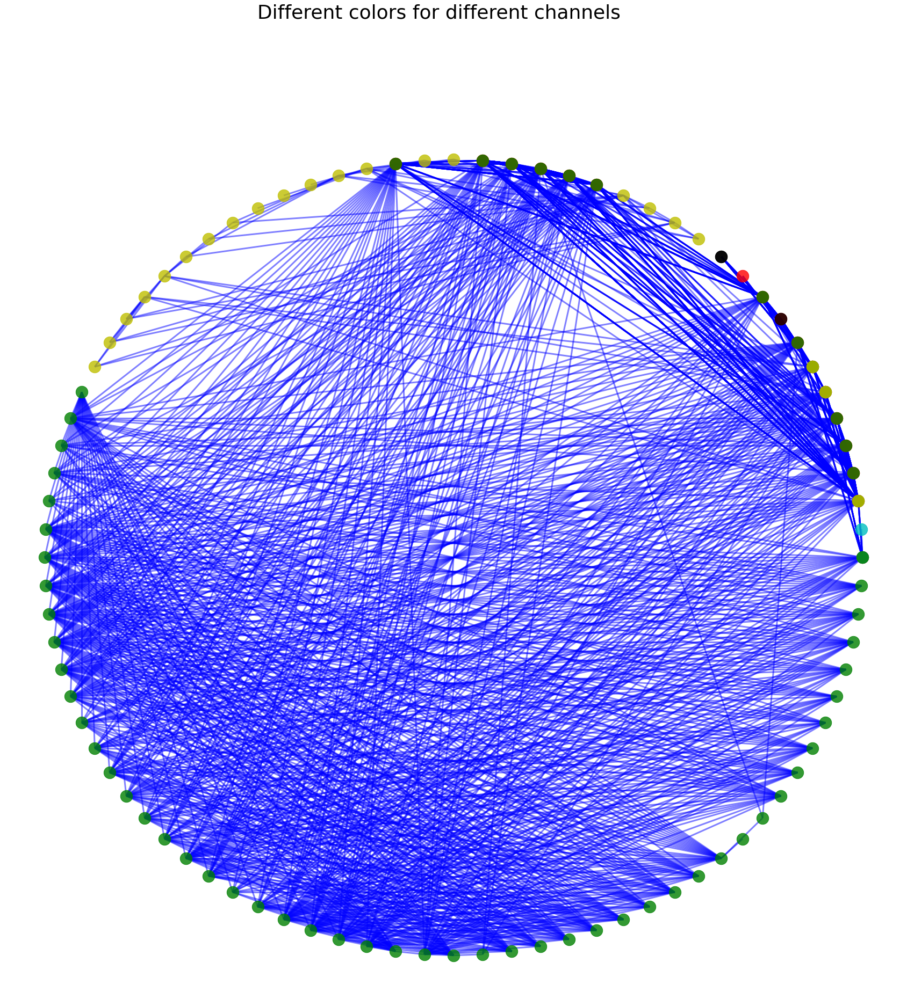

In [0]:

# Setting the graph size
f = plt.figure(figsize=(30,30))

# adding a title for the whole graph
f.suptitle('Different colors for different channels', fontsize=36)

nx.draw_networkx_nodes(GTemplateTest,pos,
                       nodelist=uniqueTemplate[0],
                       node_color='r',
                       node_size=500,
                   alpha=0.8)
nx.draw_networkx_nodes(GTemplateTest,pos,
                       nodelist=uniqueTemplate[1],
                       node_color='r',
                       node_size=500,
                   alpha=0.8)
nx.draw_networkx_nodes(GTemplateTest,pos,
                       nodelist=uniqueTemplate[2],
                       node_color='k',
                       node_size=500,
                   alpha=0.8)
nx.draw_networkx_nodes(GTemplateTest,pos,
                       nodelist=uniqueTemplate[3],
                       node_color='k',
                       node_size=500,
                   alpha=0.8)
nx.draw_networkx_nodes(GTemplateTest,pos,
                       nodelist=uniqueTemplate[4],
                       node_color='c',
                       node_size=500,
                   alpha=0.8)
nx.draw_networkx_nodes(GTemplateTest,pos,
                       nodelist=uniqueTemplate[5],
                       node_color='g',
                       node_size=500,
                   alpha=0.8)
nx.draw_networkx_nodes(GTemplateTest,pos,
                       nodelist=uniqueTemplate[6],
                       node_color='y',
                       node_size=500,
                   alpha=0.8)


# edges
#nx.draw_networkx_edges(GTemplateTest,pos,width=1.0,alpha=0.5)
nx.draw_networkx_edges(GTemplateTest,pos,
                       edgelist=templateNodesTuple,
                       width=3,alpha=0.5,edge_color='b')



plt.axis('off')
#plt.savefig("labels_and_colors.png") # save as png
plt.show()

### Graph 1 info:

In [0]:
print("Number of unique values for Source column in the Graph dataset: ", len(dfGraph1["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 0 or 1: ", 
      len(dfGraph1[(dfGraph1["eType"] == 0) | (dfGraph1["eType"] == 1)]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 2 or 3: ", 
      len(dfGraph1[(dfGraph1["eType"] == 2) | (dfGraph1["eType"] == 3)]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 4: ", 
      len(dfGraph1[dfGraph1["eType"] == 4]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 5: ", 
      len(dfGraph1[dfGraph1["eType"] == 5]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 6: ", 
      len(dfGraph1[dfGraph1["eType"] == 6]["Source"].drop_duplicates()))

Number of unique values for Source column in the Graph dataset:  58
Number of unique values for Source column in eType = 0 or 1:  17
Number of unique values for Source column in eType = 2 or 3:  2
Number of unique values for Source column in eType = 4:  1
Number of unique values for Source column in eType = 5:  47
Number of unique values for Source column in eType = 6:  13


In [0]:
print("Number of unique values for Target column in the Graph dataset: ", len(dfGraph1["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 0 or 1: ", 
      len(dfGraph1[(dfGraph1["eType"] == 0) | (dfGraph1["eType"] == 1)]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 2 or 3: ", 
      len(dfGraph1[(dfGraph1["eType"] == 2) | (dfGraph1["eType"] == 3)]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 4: ", 
      len(dfGraph1[dfGraph1["eType"] == 4]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 5: ", 
      len(dfGraph1[dfGraph1["eType"] == 5]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 6: ", 
      len(dfGraph1[dfGraph1["eType"] == 6]["Target"].drop_duplicates()))

Number of unique values for Target column in the Graph dataset:  81
Number of unique values for Target column in eType = 0 or 1:  20
Number of unique values for Target column in eType = 2 or 3:  1
Number of unique values for Target column in eType = 4:  1
Number of unique values for Target column in eType = 5:  71
Number of unique values for Target column in eType = 6:  6


### Graph 2 info:

In [0]:
print("Number of unique values for Source column in the Graph dataset: ", len(dfGraph["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 0 or 1: ", 
      len(dfGraph[(dfGraph["eType"] == 0) | (dfGraph["eType"] == 1)]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 2 or 3: ", 
      len(dfGraph[(dfGraph["eType"] == 2) | (dfGraph["eType"] == 3)]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 4: ", 
      len(dfGraph[dfGraph["eType"] == 4]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 5: ", 
      len(dfGraph[dfGraph["eType"] == 5]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 6: ", 
      len(dfGraph[dfGraph["eType"] == 6]["Source"].drop_duplicates()))

In [0]:
print("Number of unique values for Target column in the Graph dataset: ", len(dfGraph["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 0 or 1: ", 
      len(dfGraph[(dfGraph["eType"] == 0) | (dfGraph["eType"] == 1)]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 2 or 3: ", 
      len(dfGraph[(dfGraph["eType"] == 2) | (dfGraph["eType"] == 3)]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 4: ", 
      len(dfGraph[dfGraph["eType"] == 4]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 5: ", 
      len(dfGraph[dfGraph["eType"] == 5]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 6: ", 
      len(dfGraph[dfGraph["eType"] == 6]["Target"].drop_duplicates()))

### Graph 3 info:

In [0]:
print("Number of unique values for Source column in the Graph dataset: ", len(dfGraph["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 0 or 1: ", 
      len(dfGraph[(dfGraph["eType"] == 0) | (dfGraph["eType"] == 1)]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 2 or 3: ", 
      len(dfGraph[(dfGraph["eType"] == 2) | (dfGraph["eType"] == 3)]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 4: ", 
      len(dfGraph[dfGraph["eType"] == 4]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 5: ", 
      len(dfGraph[dfGraph["eType"] == 5]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 6: ", 
      len(dfGraph[dfGraph["eType"] == 6]["Source"].drop_duplicates()))

In [0]:
print("Number of unique values for Target column in the Graph dataset: ", len(dfGraph["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 0 or 1: ", 
      len(dfGraph[(dfGraph["eType"] == 0) | (dfGraph["eType"] == 1)]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 2 or 3: ", 
      len(dfGraph[(dfGraph["eType"] == 2) | (dfGraph["eType"] == 3)]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 4: ", 
      len(dfGraph[dfGraph["eType"] == 4]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 5: ", 
      len(dfGraph[dfGraph["eType"] == 5]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 6: ", 
      len(dfGraph[dfGraph["eType"] == 6]["Target"].drop_duplicates()))

### Graph 4 info:

In [0]:
print("Number of unique values for Source column in the Graph dataset: ", len(dfGraph["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 0 or 1: ", 
      len(dfGraph[(dfGraph["eType"] == 0) | (dfGraph["eType"] == 1)]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 2 or 3: ", 
      len(dfGraph[(dfGraph["eType"] == 2) | (dfGraph["eType"] == 3)]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 4: ", 
      len(dfGraph[dfGraph["eType"] == 4]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 5: ", 
      len(dfGraph[dfGraph["eType"] == 5]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 6: ", 
      len(dfGraph[dfGraph["eType"] == 6]["Source"].drop_duplicates()))

In [0]:
print("Number of unique values for Target column in the Graph dataset: ", len(dfGraph["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 0 or 1: ", 
      len(dfGraph[(dfGraph["eType"] == 0) | (dfGraph["eType"] == 1)]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 2 or 3: ", 
      len(dfGraph[(dfGraph["eType"] == 2) | (dfGraph["eType"] == 3)]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 4: ", 
      len(dfGraph[dfGraph["eType"] == 4]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 5: ", 
      len(dfGraph[dfGraph["eType"] == 5]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 6: ", 
      len(dfGraph[dfGraph["eType"] == 6]["Target"].drop_duplicates()))

### Graph 5 info:

In [0]:
print("Number of unique values for Source column in the Graph dataset: ", len(dfGraph["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 0 or 1: ", 
      len(dfGraph[(dfGraph["eType"] == 0) | (dfGraph["eType"] == 1)]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 2 or 3: ", 
      len(dfGraph[(dfGraph["eType"] == 2) | (dfGraph["eType"] == 3)]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 4: ", 
      len(dfGraph[dfGraph["eType"] == 4]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 5: ", 
      len(dfGraph[dfGraph["eType"] == 5]["Source"].drop_duplicates()))
print("Number of unique values for Source column in eType = 6: ", 
      len(dfGraph[dfGraph["eType"] == 6]["Source"].drop_duplicates()))

In [0]:
print("Number of unique values for Target column in the Graph dataset: ", len(dfGraph["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 0 or 1: ", 
      len(dfGraph[(dfGraph["eType"] == 0) | (dfGraph["eType"] == 1)]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 2 or 3: ", 
      len(dfGraph[(dfGraph["eType"] == 2) | (dfGraph["eType"] == 3)]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 4: ", 
      len(dfGraph[dfGraph["eType"] == 4]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 5: ", 
      len(dfGraph[dfGraph["eType"] == 5]["Target"].drop_duplicates()))
print("Number of unique values for Target column in eType = 6: ", 
      len(dfGraph[dfGraph["eType"] == 6]["Target"].drop_duplicates()))

### Data description of graphs

In [0]:
dfGraph1 = pd.read_csv('drive/My Drive/data/Q1-Graph1.csv')
dfGraph1.describe()

,Source,eType,Target,Time,Weight,SourceLocation,TargetLocation,SourceLatitude,SourceLongitude,TargetLatitude,TargetLongitude
count,1216.000000,1216.000000,1216.000000,1.216000e+03,1216.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000
mean,566372.039474,3.800987,566665.756579,2.582598e+07,5441.277440,1.321429,1.363095,6.367095,-31.987527,4.170833,-17.573504
std,54790.757705,2.059174,57964.828278,2.169591e+07,39348.326934,1.461364,1.416014,27.973519,74.766545,26.369127,81.208493
min,463777.000000,0.000000,459381.000000,-6.620413e+08,0.166667,0.000000,0.000000,-29.000000,-165.000000,-29.000000,-165.000000
25%,512397.000000,1.000000,523927.000000,2.283846e+07,1.000000,0.000000,0.000000,-24.565700,-110.650000,-22.000000,-48.670100
50%,570411.000000,5.000000,577992.000000,3.153600e+07,655.195000,0.000000,2.000000,27.202500,-39.026000,1.000000,-37.807600
75%,616050.000000,5.000000,620120.000000,3.153600e+07,2474.707500,3.000000,2.000000,34.295800,-34.537200,30.448300,89.421700
max,654981.000000,6.000000,657187.000000,3.153600e+07,900735.000000,5.000000,5.000000,35.880600,156.000000,35.880600,156.000000


In [0]:
dfGraph2 = pd.read_csv('drive/My Drive/data/Q1-Graph2.csv')
dfGraph2.describe()

,Source,eType,Target,Time,Weight,SourceLocation,TargetLocation,SourceLatitude,SourceLongitude,TargetLatitude,TargetLongitude
count,1300.000000,1300.000000,1300.000000,1.300000e+03,1300.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000
mean,560520.766154,3.451538,562980.933846,2.417665e+07,1207.345301,2.910448,2.930348,-12.048256,-91.897215,-12.701554,-85.900864
std,51698.445422,2.199438,57359.193017,2.862774e+07,6359.973484,1.265678,1.210423,14.429280,89.174134,13.219904,95.522699
min,464459.000000,0.000000,459381.000000,-7.327279e+08,0.018868,0.000000,1.000000,-29.452400,-166.186000,-29.452400,-168.472000
25%,527597.000000,1.000000,515794.000000,2.273466e+07,1.000000,2.000000,2.000000,-25.422000,-162.983000,-25.422000,-162.983000
50%,552988.000000,5.000000,575030.000000,3.153600e+07,216.695000,3.000000,3.000000,-3.886060,-111.678000,-20.656500,-111.678000
75%,602912.000000,5.000000,620120.000000,3.153600e+07,754.660000,4.000000,4.000000,-1.160670,-13.373000,-1.160670,-9.461840
max,656156.000000,6.000000,657173.000000,3.153600e+07,196567.000000,4.000000,4.000000,33.000000,91.000000,6.715180,91.784100


In [0]:
dfGraph3 = pd.read_csv('drive/My Drive/data/Q1-Graph3.csv')
dfGraph3.describe()

,Source,eType,Target,Time,Weight,SourceLocation,TargetLocation,SourceLatitude,SourceLongitude,TargetLatitude,TargetLongitude
count,729.000000,729.000000,729.000000,7.290000e+02,729.000000,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000
mean,549315.914952,3.980796,556662.437586,2.567313e+07,3725.984499,2.579545,2.250000,-7.726644,-23.875210,-6.859568,-20.845032
std,45556.232718,1.995782,53774.796932,1.288329e+07,13582.721364,1.566324,1.440386,21.339780,111.798051,22.110683,106.346714
min,464459.000000,0.000000,459381.000000,-2.097426e+08,0.100000,0.000000,0.000000,-29.171400,-165.000000,-29.171400,-165.000000
25%,516236.000000,5.000000,520084.000000,1.988484e+07,3.000000,1.000000,1.000000,-25.000000,-161.276000,-23.595300,-111.000000
50%,542649.000000,5.000000,567195.000000,3.153600e+07,507.470000,2.000000,2.000000,-22.000000,-13.000000,-21.141100,-26.695200
75%,578531.000000,5.000000,595581.000000,3.153600e+07,2277.900000,4.000000,4.000000,2.351660,91.000000,5.911780,91.000000
max,657076.000000,6.000000,657173.000000,3.153600e+07,159997.000000,5.000000,5.000000,33.000000,156.000000,33.574100,156.000000


In [0]:
dfGraph4 = pd.read_csv('drive/My Drive/data/Q1-Graph4.csv')
dfGraph4.describe()

,Source,eType,Target,Time,Weight,SourceLocation,TargetLocation,SourceLatitude,SourceLongitude,TargetLatitude,TargetLongitude
count,732.000000,732.000000,732.000000,7.320000e+02,732.000000,176.000000,176.000000,176.000000,176.000000,176.000000,176.000000
mean,557659.424863,4.463115,568696.844262,2.647806e+07,2154.421899,2.085227,2.534091,3.742113,-23.205082,0.518587,-35.924931
std,55986.115278,1.694121,56402.324558,8.937597e+06,8797.584281,1.829475,1.766021,26.361056,99.451602,25.551081,106.740120
min,464579.000000,0.000000,459381.000000,9.858600e+04,-1.000000,0.000000,0.000000,-29.676400,-165.000000,-35.603400,-168.957000
25%,510031.000000,5.000000,527449.000000,2.642541e+07,3.000000,0.000000,1.000000,-24.992800,-111.000000,-25.000000,-111.000000
50%,566580.000000,5.000000,577992.000000,3.153600e+07,337.480000,2.000000,3.000000,2.400530,-41.000000,1.000000,-41.778000
75%,585606.000000,5.000000,620120.000000,3.153600e+07,1370.210000,3.250000,4.000000,33.000000,91.000000,22.107250,-11.437250
max,657526.000000,6.000000,657526.000000,3.153600e+07,141744.000000,5.000000,5.000000,39.888600,156.000000,39.888600,156.256000


In [0]:
dfGraph5 = pd.read_csv('drive/My Drive/data/Q1-Graph5.csv')
dfGraph5.describe()

,Source,eType,Target,Time,Weight,SourceLocation,TargetLocation,SourceLatitude,SourceLongitude,TargetLatitude,TargetLongitude
count,395.000000,395.000000,395.000000,3.950000e+02,395.000000,124.000000,124.000000,124.000000,124.000000,124.000000,124.000000
mean,553140.425316,4.635443,566074.437975,2.345357e+07,2758.468684,2.354839,2.717742,-6.986791,-37.910244,6.701998,-13.750998
std,52601.721710,1.565413,55398.542187,1.037842e+07,22597.362966,1.432455,1.990059,22.733813,103.415153,23.400234,119.389382
min,477657.000000,0.000000,459381.000000,9.634600e+04,-1.000000,0.000000,0.000000,-29.000000,-170.646000,-29.000000,-170.646000
25%,510031.000000,5.000000,523927.000000,1.494720e+07,1.000000,2.000000,1.000000,-25.000000,-111.000000,-22.000000,-111.000000
50%,552988.000000,5.000000,567195.000000,3.153600e+07,198.000000,2.500000,3.000000,-22.000000,-41.000000,22.000000,-41.000000
75%,594308.000000,6.000000,616453.000000,3.153600e+07,983.360000,3.000000,5.000000,1.000000,91.000000,23.280775,152.200000
max,631903.000000,6.000000,657173.000000,3.153600e+07,441206.000000,5.000000,5.000000,33.000000,156.000000,33.000000,156.000000


### details of the graphs in quesion 1

In [0]:
sourceG1 = dfGraph1["Source"].to_numpy()
targetG1 = dfGraph1["Target"].to_numpy()
sourceCategoriesG1 = list()
targetCategoriesG1 = list()
for i in range(len(categoriesList)):
  if(categoriesList[i][0] in sourceG1):
    sourceCategoriesG1.append(categoriesList[i][1])
  if(categoriesList[i][0] in targetG1):
    targetCategoriesG1.append(categoriesList[i][1])
print("sourceCategoriesG1:   ", len(sourceCategoriesG1), sourceCategoriesG1)
print("targetCategoriesG1:   ", len(targetCategoriesG1), targetCategoriesG1)

sourceCategoriesG1:    3 ['Gifts', 'Money income before taxes', 'Personal taxes']
targetCategoriesG1:    27 ['Water and other public services', 'Electricity', 'Household furnishings', 'Natural gas', 'Miscellaneous', 'Healthcare', 'Restaurants', 'Alcohol', 'Home maintenance', 'Housekeeping supplies', 'Personal insurance and pensions', 'Reading', 'Transportation', 'Education', 'Telephone services', 'Lodging away from home', 'Groceries', 'Donations', 'Entertainment', 'Apparel and services', 'Personal taxes', 'Mortgage payments', 'Rented dwellings', 'Personal care products and services', 'Tobacco', 'Household operations', 'Property taxes']


In [0]:
sourceG1 = dfGraph2["Source"].to_numpy()
targetG1 = dfGraph2["Target"].to_numpy()
sourceCategoriesG1 = list()
targetCategoriesG1 = list()
for i in range(len(categoriesList)):
  if(categoriesList[i][0] in sourceG1):
    sourceCategoriesG1.append(categoriesList[i][1])
  if(categoriesList[i][0] in targetG1):
    targetCategoriesG1.append(categoriesList[i][1])
print("sourceCategoriesG1:   ", len(sourceCategoriesG1), sourceCategoriesG1)
print("targetCategoriesG1:   ", len(targetCategoriesG1), targetCategoriesG1)

sourceCategoriesG1:    3 ['Gifts', 'Money income before taxes', 'Personal taxes']
targetCategoriesG1:    27 ['Water and other public services', 'Electricity', 'Household furnishings', 'Natural gas', 'Miscellaneous', 'Healthcare', 'Restaurants', 'Alcohol', 'Home maintenance', 'Housekeeping supplies', 'Personal insurance and pensions', 'Reading', 'Transportation', 'Education', 'Telephone services', 'Lodging away from home', 'Groceries', 'Donations', 'Entertainment', 'Apparel and services', 'Personal taxes', 'Mortgage payments', 'Rented dwellings', 'Personal care products and services', 'Tobacco', 'Household operations', 'Property taxes']


In [0]:
sourceG1 = dfGraph3["Source"].to_numpy()
targetG1 = dfGraph3["Target"].to_numpy()
sourceCategoriesG1 = list()
targetCategoriesG1 = list()
for i in range(len(categoriesList)):
  if(categoriesList[i][0] in sourceG1):
    sourceCategoriesG1.append(categoriesList[i][1])
  if(categoriesList[i][0] in targetG1):
    targetCategoriesG1.append(categoriesList[i][1])
print("sourceCategoriesG1:   ", len(sourceCategoriesG1), sourceCategoriesG1)
print("targetCategoriesG1:   ", len(targetCategoriesG1), targetCategoriesG1)

sourceCategoriesG1:    3 ['Gifts', 'Money income before taxes', 'Personal taxes']
targetCategoriesG1:    27 ['Water and other public services', 'Electricity', 'Household furnishings', 'Natural gas', 'Miscellaneous', 'Healthcare', 'Restaurants', 'Alcohol', 'Home maintenance', 'Housekeeping supplies', 'Personal insurance and pensions', 'Reading', 'Transportation', 'Education', 'Telephone services', 'Lodging away from home', 'Groceries', 'Donations', 'Entertainment', 'Apparel and services', 'Personal taxes', 'Mortgage payments', 'Rented dwellings', 'Personal care products and services', 'Tobacco', 'Household operations', 'Property taxes']


In [0]:
sourceG1 = dfGraph4["Source"].to_numpy()
targetG1 = dfGraph4["Target"].to_numpy()
sourceCategoriesG1 = list()
targetCategoriesG1 = list()
for i in range(len(categoriesList)):
  if(categoriesList[i][0] in sourceG1):
    sourceCategoriesG1.append(categoriesList[i][1])
  if(categoriesList[i][0] in targetG1):
    targetCategoriesG1.append(categoriesList[i][1])
print("sourceCategoriesG1:   ", len(sourceCategoriesG1), sourceCategoriesG1)
print("targetCategoriesG1:   ", len(targetCategoriesG1), targetCategoriesG1)

sourceCategoriesG1:    3 ['Gifts', 'Money income before taxes', 'Personal taxes']
targetCategoriesG1:    27 ['Water and other public services', 'Electricity', 'Household furnishings', 'Natural gas', 'Miscellaneous', 'Healthcare', 'Restaurants', 'Alcohol', 'Home maintenance', 'Housekeeping supplies', 'Personal insurance and pensions', 'Reading', 'Transportation', 'Education', 'Telephone services', 'Lodging away from home', 'Groceries', 'Donations', 'Entertainment', 'Apparel and services', 'Personal taxes', 'Mortgage payments', 'Rented dwellings', 'Personal care products and services', 'Tobacco', 'Household operations', 'Property taxes']


In [0]:
sourceG1 = dfGraph5["Source"].to_numpy()
targetG1 = dfGraph5["Target"].to_numpy()
sourceCategoriesG1 = list()
targetCategoriesG1 = list()
for i in range(len(categoriesList)):
  if(categoriesList[i][0] in sourceG1):
    sourceCategoriesG1.append(categoriesList[i][0])
  if(categoriesList[i][0] in targetG1):
    targetCategoriesG1.append(categoriesList[i][0])
print("sourceCategoriesG1:   ", len(sourceCategoriesG1), sourceCategoriesG1)
print("targetCategoriesG1:   ", len(targetCategoriesG1), targetCategoriesG1)

sourceCategoriesG1:    3 [510031, 552988, 620120]
targetCategoriesG1:    27 [459381, 466907, 473173, 503218, 503701, 520660, 523927, 527449, 536346, 537281, 567195, 571970, 575030, 577992, 580426, 589943, 595298, 595581, 606730, 616315, 620120, 621924, 630626, 632961, 640784, 642329, 644226]


In [0]:
for val in dfGraph1[(dfGraph1["eType"] == 6)]["Source"]:
  if val in list(dfGraph1[(dfGraph1["eType"] == 6)]["Target"]):
    print("A match is found", end =", ")

In [0]:
'''for val in dfGraph2[(dfGraph2["eType"] == 0) | (dfGraph2["eType"] == 1)]["Source"]:
  if val in list(dfGraph2[(dfGraph2["eType"] == 0)]["Target"]):
    pass
    #print("A match is found", end =", ")'''

'for val in dfGraph2[(dfGraph2["eType"] == 0) | (dfGraph2["eType"] == 1)]["Source"]:\n  if val in list(dfGraph2[(dfGraph2["eType"] == 0)]["Target"]):\n    pass\n    #print("A match is found", end =", ")'

## Comparing the weights in the Template and the graphs for channel eType = 5

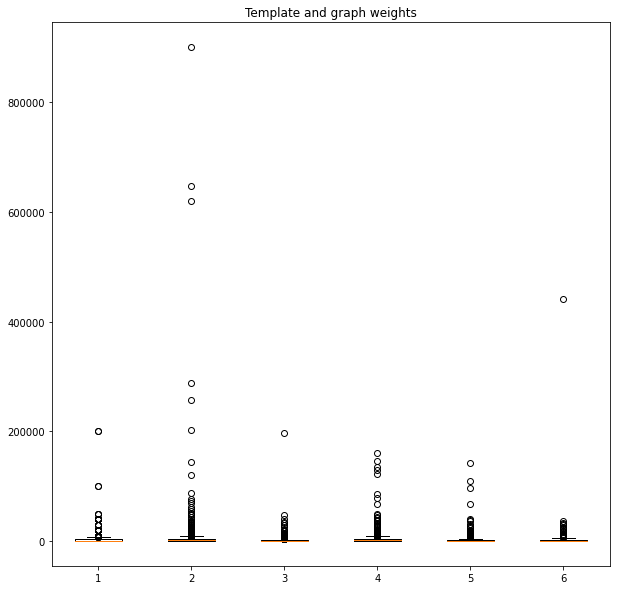

In [0]:
data = [list(dfTemplate[dfTemplate["eType"] == 5]["Weight"]), 
        list(dfGraph1[dfGraph1["eType"] == 5]["Weight"]), 
        list(dfGraph2[dfGraph2["eType"] == 5]["Weight"]), 
        list(dfGraph3[dfGraph3["eType"] == 5]["Weight"]), 
        list(dfGraph4[dfGraph4["eType"] == 5]["Weight"]), 
        list(dfGraph5[dfGraph5["eType"] == 5]["Weight"])]
fig7, ax7 = plt.subplots()
ax7.set_title('Template and graph weights')
ax7.boxplot(data)
ax7.figure.set_size_inches(10, 10)
#ax7.set_ylim([-5,20000])
plt.show()

### Changing the scale of y to see the boxes

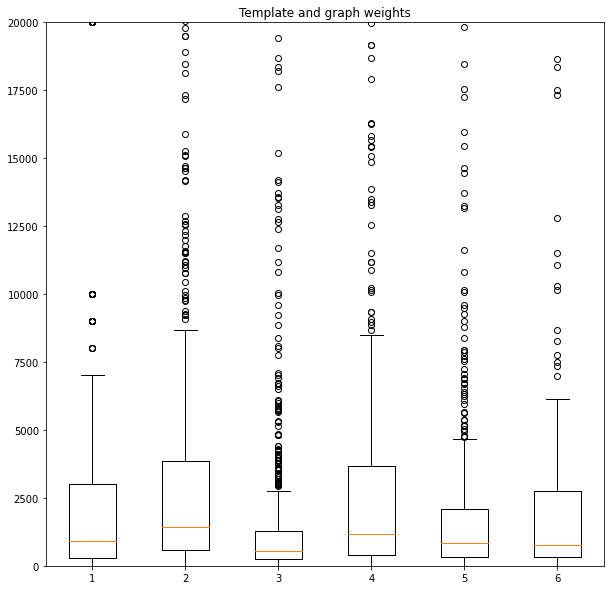

In [0]:
data = [list(dfTemplate[dfTemplate["eType"] == 5]["Weight"]), 
        list(dfGraph1[dfGraph1["eType"] == 5]["Weight"]), 
        list(dfGraph2[dfGraph2["eType"] == 5]["Weight"]), 
        list(dfGraph3[dfGraph3["eType"] == 5]["Weight"]), 
        list(dfGraph4[dfGraph4["eType"] == 5]["Weight"]), 
        list(dfGraph5[dfGraph5["eType"] == 5]["Weight"])]
fig7, ax7 = plt.subplots()
ax7.set_title('Template and graph weights')
ax7.boxplot(data)
ax7.figure.set_size_inches(10, 10)
ax7.set_ylim([-5,20000])
#ax7.set_ylabel('Template', 'Graph 1', 'Graph 2', 'Graph 3', 'Graph 4', 'Graph 5')
plt.show()

In [0]:
len([list(dfTemplate["Weight"]), list(dfGraph1["Weight"])])

2

## Testing the network graph

In [0]:
import networkx as nx

In [0]:
G = nx.Graph()

In [0]:
templateG = nx.Graph()
graph1G = nx.Graph()
graph2G = nx.Graph()
graph3G = nx.Graph()
graph4G = nx.Graph()
graph5G = nx.Graph()

In [0]:
G.number_of_nodes()

0

In [0]:
G.number_of_edges()

969311

In [0]:
sampleFromBigGraph01 = dfBigGraph.iloc[0:10000,[0,2]]
sampleFromBigGraph01

,Source,Target
0,639754,643327
1,603100,643327
2,577847,643327
3,466246,643327
4,633499,549896
...,...,...
9995,623708,644118
9996,535817,644118
9997,603884,644118
9998,641144,644118


In [0]:
templateNodesTuple = [tuple([x, y]) for x, y in zip(dfTemplate["Source"], dfTemplate["Target"])]
graph1NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph1["Source"], dfGraph1["Target"])]
graph2NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph2["Source"], dfGraph2["Target"])]
graph3NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph3["Source"], dfGraph3["Target"])]
graph4NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph4["Source"], dfGraph4["Target"])]
graph5NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph5["Source"], dfGraph5["Target"])]

In [0]:
templateG.add_edges_from(templateNodesTuple)
graph1G.add_edges_from(graph1NodesTuple)
graph2G.add_edges_from(graph2NodesTuple)
graph3G.add_edges_from(graph3NodesTuple)
graph4G.add_edges_from(graph4NodesTuple)
graph5G.add_edges_from(graph5NodesTuple)

In [0]:
print("Template network has ", templateG.number_of_edges(), " edges and ", templateG.number_of_nodes(), " nodes")
print("Graph1 network has ", graph1G.number_of_edges(), " edges and ", graph1G.number_of_nodes(), " nodes")
print("Graph2 network has ", graph2G.number_of_edges(), " edges and ", graph2G.number_of_nodes(), " nodes")
print("Graph3 network has ", graph3G.number_of_edges(), " edges and ", graph3G.number_of_nodes(), " nodes")
print("Graph4 network has ", graph4G.number_of_edges(), " edges and ", graph4G.number_of_nodes(), " nodes")
print("Graph5 network has ", graph5G.number_of_edges(), " edges and ", graph5G.number_of_nodes(), " nodes")

Template network has  813  edges and  88  nodes
Graph1 network has  949  edges and  93  nodes
Graph2 network has  915  edges and  87  nodes
Graph3 network has  590  edges and  79  nodes
Graph4 network has  607  edges and  87  nodes
Graph5 network has  285  edges and  86  nodes


In [0]:
print("Template node list:\n", list(templateG.nodes))
print("Graph1 node list:\n", list(graph1G.nodes))
print("Graph2 node list:\n", list(graph2G.nodes))
print("Graph3 node list:\n", list(graph3G.nodes))
print("Graph4 node list:\n", list(graph4G.nodes))
print("Graph5 node list:\n", list(graph5G.nodes))

Template node list:
 [0, -99, 41, 34, 37, 27, 40, 39, 65, 67, 47, 66, 657187, 78, 81, 80, 70, 43, 56, 57, 58, 63, 77, 79, 45, 69, 76, 82, 83, 84, 73, 75, 74, 71, 72, 87, 85, 86, 2, 630626, 536346, 510031, 520660, 552988, 567195, 527449, 459381, 595298, 466907, 589943, 577992, 537281, 523927, 580426, 595581, 642329, 503701, 571970, 644226, 632961, 473173, 620120, 621924, 616315, 29, 575030, 31, 503218, 33, 35, 36, 38, 42, 44, 46, 48, 49, 640784, 606730, 52, 53, 54, 55, 59, 60, 61, 62, 64]
Graph1 node list:
 [616050, 590502, 599956, 635665, 490041, 589639, 533140, 591682, 568093, 632150, 464459, 512397, 550287, 559657, 623295, 492777, 570411, 550361, 493044, 596193, 640464, 657187, 629627, 625756, 657173, 599441, 534034, 585212, 509607, 499467, 538892, 542965, 572391, 561157, 649553, 570284, 643925, 616453, 608827, 630626, 552988, 567195, 527449, 459381, 595298, 466907, 589943, 537281, 580426, 595581, 616315, 642329, 503701, 632961, 473173, 620120, 575030, 621924, 536346, 510031, 520660,

In [0]:
print("Template: ", nx.transitivity(templateG))
print("Graph1: ", nx.transitivity(graph1G))
print("Graph2: ", nx.transitivity(graph2G))
print("Graph3: ", nx.transitivity(graph3G))
print("Graph4: ", nx.transitivity(graph4G))
print("Graph5: ", nx.transitivity(graph5G))

Template:  0.16859122401847576
Graph1:  0.11303058238807166
Graph2:  0.12384809289640068
Graph3:  0.11512877366535904
Graph4:  0.222864768683274
Graph5:  0.21711899791231734


In [0]:
print("Number of triangles for each node in the Template:\n", nx.triangles(templateG))
print("Number of triangles for each node in the Graph1:\n", nx.triangles(graph1G))
print("Number of triangles for each node in the Graph2:\n", nx.triangles(graph2G))
print("Number of triangles for each node in the Graph3:\n", nx.triangles(graph3G))
print("Number of triangles for each node in the Graph4:\n", nx.triangles(graph4G))
print("Number of triangles for each node in the Graph5:\n", nx.triangles(graph5G))

Number of triangles for each node in the Template:
 {0: 48, -99: 0, 41: 251, 34: 170, 37: 180, 27: 189, 40: 73, 39: 60, 65: 64, 67: 2, 47: 175, 66: 0, 657187: 1, 78: 0, 81: 0, 80: 0, 70: 3, 43: 191, 56: 190, 57: 189, 58: 167, 63: 195, 77: 0, 79: 0, 45: 211, 69: 3, 76: 0, 82: 0, 83: 0, 84: 0, 73: 0, 75: 0, 74: 0, 71: 3, 72: 3, 87: 0, 85: 0, 86: 0, 2: 0, 630626: 21, 536346: 7, 510031: 13, 520660: 3, 552988: 64, 567195: 50, 527449: 64, 459381: 64, 595298: 64, 466907: 42, 589943: 50, 577992: 8, 537281: 20, 523927: 37, 580426: 26, 595581: 18, 642329: 24, 503701: 45, 571970: 46, 644226: 7, 632961: 29, 473173: 64, 620120: 64, 621924: 23, 616315: 30, 29: 0, 575030: 33, 31: 0, 503218: 1, 33: 0, 35: 0, 36: 0, 38: 0, 42: 0, 44: 0, 46: 0, 48: 0, 49: 0, 640784: 0, 606730: 0, 52: 0, 53: 0, 54: 0, 55: 0, 59: 0, 60: 0, 61: 0, 62: 0, 64: 0}
Number of triangles for each node in the Graph1:
 {616050: 73, 590502: 0, 599956: 191, 635665: 233, 490041: 150, 589639: 91, 533140: 84, 591682: 42, 568093: 89, 632

#### Different channels network graphs

##### Communication Channel (eType = 0 , 1)

In [0]:
# Putting the Source and Target values in tuples for each corresponding graph
templateNodesTuple = [tuple([x, y]) for x, y in zip(dfTemplate[(dfTemplate["eType"] == 0) | (dfTemplate["eType"] == 1)]["Source"],
                      dfTemplate[(dfTemplate["eType"] == 0) | (dfTemplate["eType"] == 1)]["Target"])]
graph1NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph1[(dfGraph1["eType"] == 0) | (dfGraph1["eType"] == 1)]["Source"], 
                                                  dfGraph1[(dfGraph1["eType"] == 0) | (dfGraph1["eType"] == 1)]["Target"])]
graph2NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph2[(dfGraph2["eType"] == 0) | (dfGraph2["eType"] == 1)]["Source"], 
                                                  dfGraph2[(dfGraph2["eType"] == 0) | (dfGraph2["eType"] == 1)]["Target"])]
graph3NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph3[(dfGraph3["eType"] == 0) | (dfGraph3["eType"] == 1)]["Source"], 
                                                  dfGraph3[(dfGraph3["eType"] == 0) | (dfGraph3["eType"] == 1)]["Target"])]
graph4NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph4[(dfGraph4["eType"] == 0) | (dfGraph4["eType"] == 1)]["Source"], 
                                                  dfGraph4[(dfGraph4["eType"] == 0) | (dfGraph4["eType"] == 1)]["Target"])]
graph5NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph5[(dfGraph5["eType"] == 0) | (dfGraph5["eType"] == 1)]["Source"], 
                                                  dfGraph5[(dfGraph5["eType"] == 0) | (dfGraph5["eType"] == 1)]["Target"])]

In [0]:
# creating networkx empty graphs
templateG = nx.Graph()
graph1G = nx.Graph()
graph2G = nx.Graph()
graph3G = nx.Graph()
graph4G = nx.Graph()
graph5G = nx.Graph()

In [0]:
# Creating graph objects from the tuples
templateG.add_edges_from(templateNodesTuple)
graph1G.add_edges_from(graph1NodesTuple)
graph2G.add_edges_from(graph2NodesTuple)
graph3G.add_edges_from(graph3NodesTuple)
graph4G.add_edges_from(graph4NodesTuple)
graph5G.add_edges_from(graph5NodesTuple)

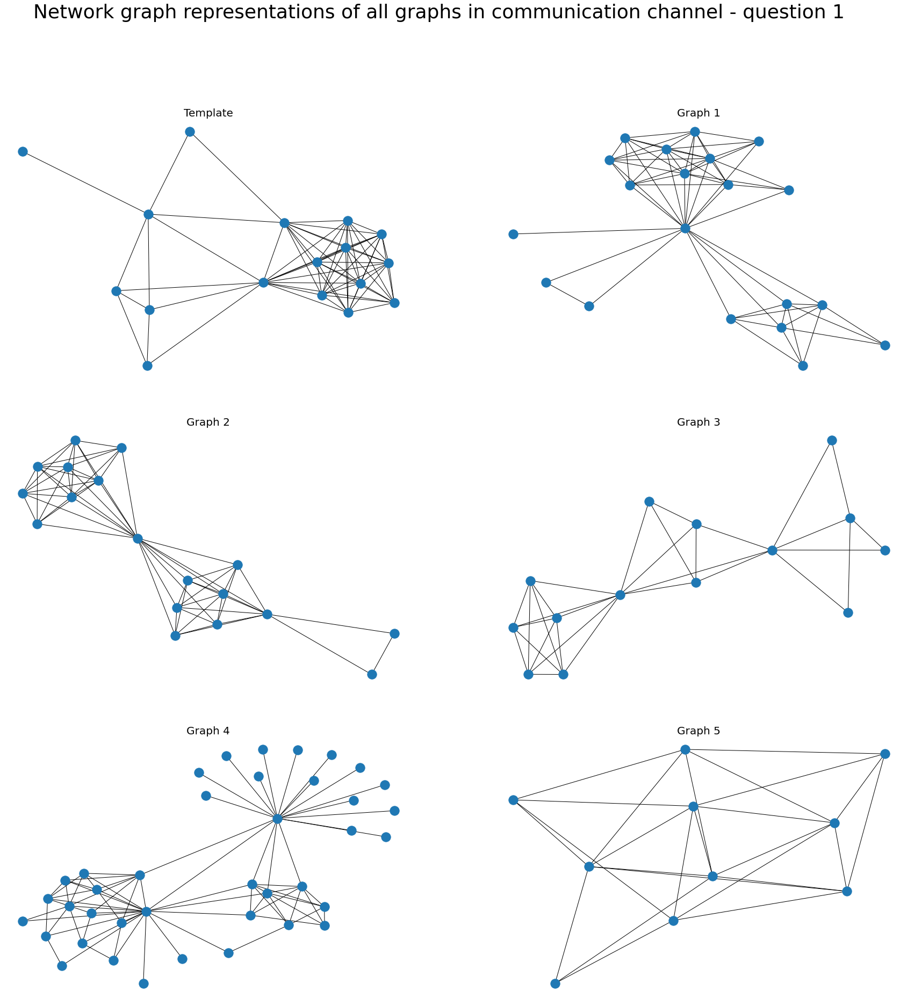

In [0]:
# Setting the graph size
f = plt.figure(figsize=(30,30))

# adding a title for the whole graph
f.suptitle('Network graph representations of all graphs in communication channel - question 1', fontsize=36)
axs = list()
# Template subplot
axs.append(f.add_subplot(321))
nx.draw(templateG, with_labels=False, font_weight='bold', ax=axs[0])
axs[0].set_title('Template', fontsize = 20)

# Graph 1
axs.append(f.add_subplot(322))
nx.draw(graph1G, with_labels=False, font_weight='bold', ax=axs[1])
axs[1].set_title('Graph 1', fontsize = 20)

# Graph 2
axs.append(f.add_subplot(323))
nx.draw(graph2G, with_labels=False, font_weight='bold', ax=axs[2])
axs[2].set_title('Graph 2', fontsize = 20)

# Graph 3
axs.append(f.add_subplot(324))
nx.draw(graph3G, with_labels=False, font_weight='bold', ax=axs[3])
axs[3].set_title('Graph 3', fontsize = 20)

# Graph 4
axs.append(f.add_subplot(325))
nx.draw(graph4G, with_labels=False, font_weight='bold', ax=axs[4])
axs[4].set_title('Graph 4', fontsize = 20)

# Graph 5
axs.append(f.add_subplot(326))
nx.draw(graph5G, with_labels=False, font_weight='bold', ax=axs[5])
axs[5].set_title('Graph 5', fontsize = 20)


plt.show()

##### Procurement Channel eType = 2, 3

In [0]:
# Putting the Source and Target values in tuples for each corresponding graph
templateNodesTuple = [tuple([x, y]) for x, y in zip(dfTemplate[(dfTemplate["eType"] == 2) | (dfTemplate["eType"] == 3)]["Source"],
                      dfTemplate[(dfTemplate["eType"] == 2) | (dfTemplate["eType"] == 3)]["Target"])]
graph1NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph1[(dfGraph1["eType"] == 2) | (dfGraph1["eType"] == 3)]["Source"], 
                                                  dfGraph1[(dfGraph1["eType"] == 2) | (dfGraph1["eType"] == 3)]["Target"])]
graph2NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph2[(dfGraph2["eType"] == 2) | (dfGraph2["eType"] == 3)]["Source"], 
                                                  dfGraph2[(dfGraph2["eType"] == 2) | (dfGraph2["eType"] == 3)]["Target"])]
graph3NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph3[(dfGraph3["eType"] == 2) | (dfGraph3["eType"] == 3)]["Source"], 
                                                  dfGraph3[(dfGraph3["eType"] == 2) | (dfGraph3["eType"] == 3)]["Target"])]
graph4NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph4[(dfGraph4["eType"] == 2) | (dfGraph4["eType"] == 3)]["Source"], 
                                                  dfGraph4[(dfGraph4["eType"] == 2) | (dfGraph4["eType"] == 3)]["Target"])]
graph5NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph5[(dfGraph5["eType"] == 2) | (dfGraph5["eType"] == 3)]["Source"], 
                                                  dfGraph5[(dfGraph5["eType"] == 2) | (dfGraph5["eType"] == 3)]["Target"])]

In [0]:
# creating networkx empty graphs
templateG = nx.Graph()
graph1G = nx.Graph()
graph2G = nx.Graph()
graph3G = nx.Graph()
graph4G = nx.Graph()
graph5G = nx.Graph()

In [0]:
# Creating graph objects from the tuples
templateG.add_edges_from(templateNodesTuple)
graph1G.add_edges_from(graph1NodesTuple)
graph2G.add_edges_from(graph2NodesTuple)
graph3G.add_edges_from(graph3NodesTuple)
graph4G.add_edges_from(graph4NodesTuple)
graph5G.add_edges_from(graph5NodesTuple)

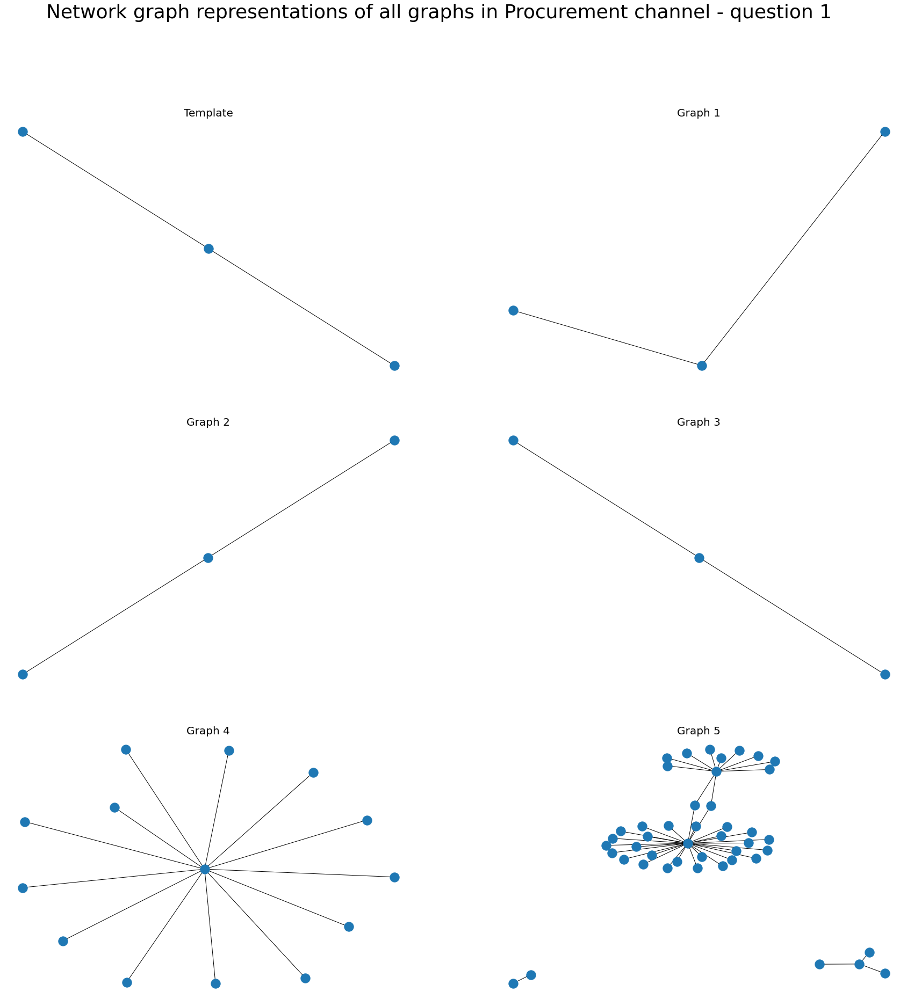

In [0]:
# Setting the graph size
f = plt.figure(figsize=(30,30))

# adding a title for the whole graph
f.suptitle('Network graph representations of all graphs in Procurement channel - question 1', fontsize=36)
axs = list()
# Template subplot
axs.append(f.add_subplot(321))
nx.draw(templateG, with_labels=False, font_weight='bold', ax=axs[0])
axs[0].set_title('Template', fontsize = 20)

# Graph 1
axs.append(f.add_subplot(322))
nx.draw(graph1G, with_labels=False, font_weight='bold', ax=axs[1])
axs[1].set_title('Graph 1', fontsize = 20)

# Graph 2
axs.append(f.add_subplot(323))
nx.draw(graph2G, with_labels=False, font_weight='bold', ax=axs[2])
axs[2].set_title('Graph 2', fontsize = 20)

# Graph 3
axs.append(f.add_subplot(324))
nx.draw(graph3G, with_labels=False, font_weight='bold', ax=axs[3])
axs[3].set_title('Graph 3', fontsize = 20)

# Graph 4
axs.append(f.add_subplot(325))
nx.draw(graph4G, with_labels=False, font_weight='bold', ax=axs[4])
axs[4].set_title('Graph 4', fontsize = 20)

# Graph 5
axs.append(f.add_subplot(326))
nx.draw(graph5G, with_labels=False, font_weight='bold', ax=axs[5])
axs[5].set_title('Graph 5', fontsize = 20)


plt.show()

##### Co-authorship Channel (eType = 4)

In [0]:
# Putting the Source and Target values in tuples for each corresponding graph
templateNodesTuple = [tuple([x, y]) for x, y in zip(dfTemplate[(dfTemplate["eType"] == 4)]["Source"], 
                                                    dfTemplate[(dfTemplate["eType"] == 4)]["Target"])]
graph1NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph1[(dfGraph1["eType"] == 4) ]["Source"], 
                                                  dfGraph1[(dfGraph1["eType"] == 4) ]["Target"])]
graph2NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph2[(dfGraph2["eType"] == 4) ]["Source"], 
                                                  dfGraph2[(dfGraph2["eType"] == 4) ]["Target"])]
graph3NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph3[(dfGraph3["eType"] == 4) ]["Source"], 
                                                  dfGraph3[(dfGraph3["eType"] == 4) ]["Target"])]
graph4NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph4[(dfGraph4["eType"] == 4) ]["Source"], 
                                                  dfGraph4[(dfGraph4["eType"] == 4) ]["Target"])]
graph5NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph5[(dfGraph5["eType"] == 4) ]["Source"], 
                                                  dfGraph5[(dfGraph5["eType"] == 4) ]["Target"])]

In [0]:
# creating networkx empty graphs
templateG = nx.Graph()
graph1G = nx.Graph()
graph2G = nx.Graph()
graph3G = nx.Graph()
graph4G = nx.Graph()
graph5G = nx.Graph()

In [0]:
# Creating graph objects from the tuples
templateG.add_edges_from(templateNodesTuple)
graph1G.add_edges_from(graph1NodesTuple)
graph2G.add_edges_from(graph2NodesTuple)
graph3G.add_edges_from(graph3NodesTuple)
graph4G.add_edges_from(graph4NodesTuple)
graph5G.add_edges_from(graph5NodesTuple)

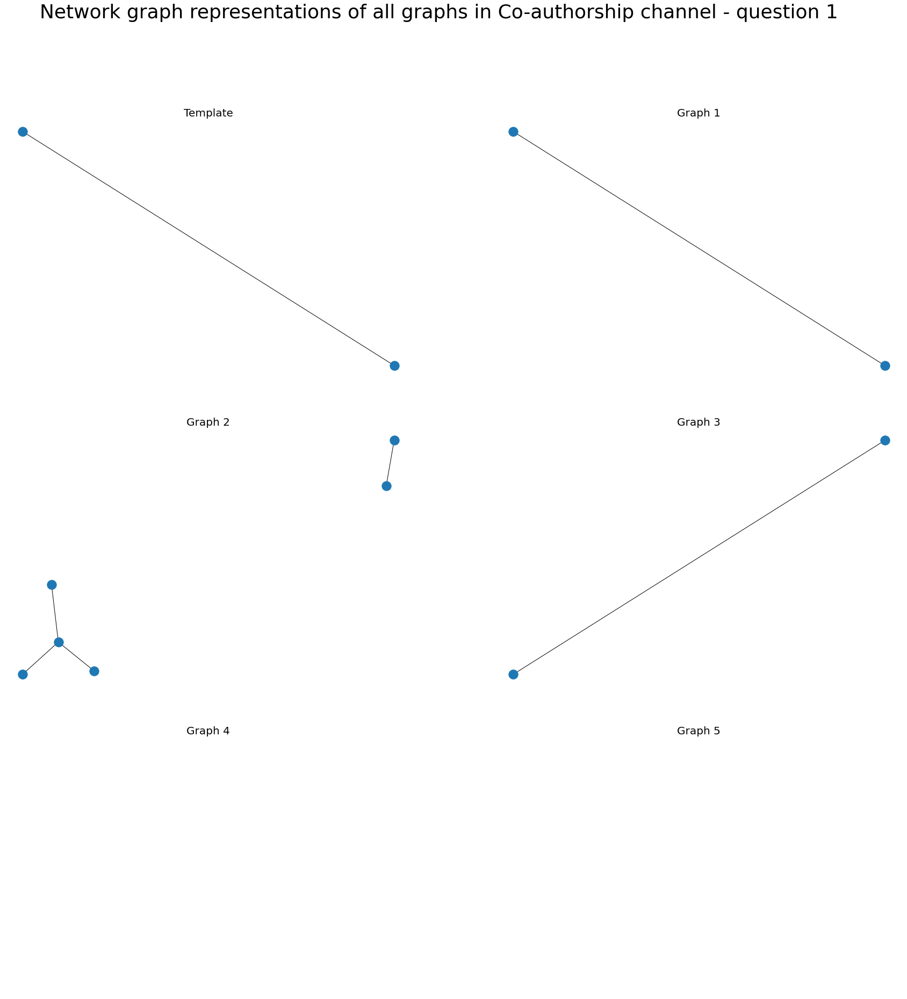

In [0]:
# Setting the graph size
f = plt.figure(figsize=(30,30))

# adding a title for the whole graph
f.suptitle('Network graph representations of all graphs in Co-authorship channel - question 1', fontsize=36)
axs = list()
# Template subplot
axs.append(f.add_subplot(321))
nx.draw(templateG, with_labels=False, font_weight='bold', ax=axs[0])
axs[0].set_title('Template', fontsize = 20)

# Graph 1
axs.append(f.add_subplot(322))
nx.draw(graph1G, with_labels=False, font_weight='bold', ax=axs[1])
axs[1].set_title('Graph 1', fontsize = 20)

# Graph 2
axs.append(f.add_subplot(323))
nx.draw(graph2G, with_labels=False, font_weight='bold', ax=axs[2])
axs[2].set_title('Graph 2', fontsize = 20)

# Graph 3
axs.append(f.add_subplot(324))
nx.draw(graph3G, with_labels=False, font_weight='bold', ax=axs[3])
axs[3].set_title('Graph 3', fontsize = 20)

# Graph 4
axs.append(f.add_subplot(325))
nx.draw(graph4G, with_labels=False, font_weight='bold', ax=axs[4])
axs[4].set_title('Graph 4', fontsize = 20)

# Graph 5
axs.append(f.add_subplot(326))
nx.draw(graph5G, with_labels=False, font_weight='bold', ax=axs[5])
axs[5].set_title('Graph 5', fontsize = 20)


plt.show()

##### Demographics Channel (eType = 5)

In [0]:
# Putting the Source and Target values in tuples for each corresponding graph
templateNodesTuple = [tuple([x, y]) for x, y in zip(dfTemplate[(dfTemplate["eType"] == 5)]["Source"], 
                                                    dfTemplate[(dfTemplate["eType"] == 5)]["Target"])]
graph1NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph1[(dfGraph1["eType"] == 5) ]["Source"], 
                                                  dfGraph1[(dfGraph1["eType"] == 5) ]["Target"])]
graph2NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph2[(dfGraph2["eType"] == 5) ]["Source"], 
                                                  dfGraph2[(dfGraph2["eType"] == 5) ]["Target"])]
graph3NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph3[(dfGraph3["eType"] == 5) ]["Source"], 
                                                  dfGraph3[(dfGraph3["eType"] == 5) ]["Target"])]
graph4NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph4[(dfGraph4["eType"] == 5) ]["Source"], 
                                                  dfGraph4[(dfGraph4["eType"] == 5) ]["Target"])]
graph5NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph5[(dfGraph5["eType"] == 5) ]["Source"], 
                                                  dfGraph5[(dfGraph5["eType"] == 5) ]["Target"])]

In [0]:
# creating networkx empty graphs
templateG = nx.Graph()
graph1G = nx.Graph()
graph2G = nx.Graph()
graph3G = nx.Graph()
graph4G = nx.Graph()
graph5G = nx.Graph()

In [0]:
# Creating graph objects from the tuples
templateG.add_edges_from(templateNodesTuple)
graph1G.add_edges_from(graph1NodesTuple)
graph2G.add_edges_from(graph2NodesTuple)
graph3G.add_edges_from(graph3NodesTuple)
graph4G.add_edges_from(graph4NodesTuple)
graph5G.add_edges_from(graph5NodesTuple)

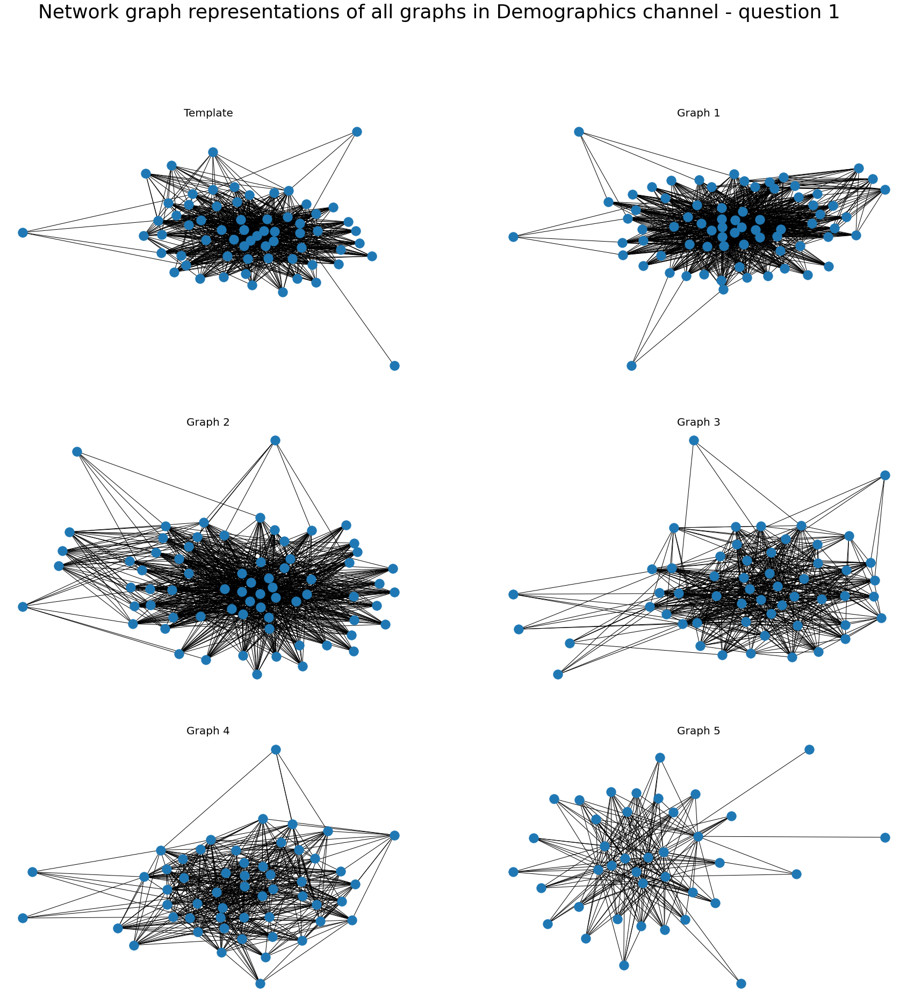

In [0]:
# Setting the graph size
f = plt.figure(figsize=(30,30))

# adding a title for the whole graph
f.suptitle('Network graph representations of all graphs in Demographics channel - question 1', fontsize=36)
axs = list()
# Template subplot
axs.append(f.add_subplot(321))
nx.draw(templateG, with_labels=False, font_weight='bold', ax=axs[0])
axs[0].set_title('Template', fontsize = 20)

# Graph 1
axs.append(f.add_subplot(322))
nx.draw(graph1G, with_labels=False, font_weight='bold', ax=axs[1])
axs[1].set_title('Graph 1', fontsize = 20)

# Graph 2
axs.append(f.add_subplot(323))
nx.draw(graph2G, with_labels=False, font_weight='bold', ax=axs[2])
axs[2].set_title('Graph 2', fontsize = 20)

# Graph 3
axs.append(f.add_subplot(324))
nx.draw(graph3G, with_labels=False, font_weight='bold', ax=axs[3])
axs[3].set_title('Graph 3', fontsize = 20)

# Graph 4
axs.append(f.add_subplot(325))
nx.draw(graph4G, with_labels=False, font_weight='bold', ax=axs[4])
axs[4].set_title('Graph 4', fontsize = 20)

# Graph 5
axs.append(f.add_subplot(326))
nx.draw(graph5G, with_labels=False, font_weight='bold', ax=axs[5])
axs[5].set_title('Graph 5', fontsize = 20)


plt.show()

##### Travel Channel (eType = 6)

In [0]:
# Putting the Source and Target values in tuples for each corresponding graph
templateNodesTuple = [tuple([x, y]) for x, y in zip(dfTemplate[(dfTemplate["eType"] == 6)]["Source"], 
                                                    dfTemplate[(dfTemplate["eType"] == 6)]["Target"])]
graph1NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph1[(dfGraph1["eType"] == 6) ]["Source"], 
                                                  dfGraph1[(dfGraph1["eType"] == 6) ]["Target"])]
graph2NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph2[(dfGraph2["eType"] == 6) ]["Source"], 
                                                  dfGraph2[(dfGraph2["eType"] == 6) ]["Target"])]
graph3NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph3[(dfGraph3["eType"] == 6) ]["Source"], 
                                                  dfGraph3[(dfGraph3["eType"] == 6) ]["Target"])]
graph4NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph4[(dfGraph4["eType"] == 6) ]["Source"], 
                                                  dfGraph4[(dfGraph4["eType"] == 6) ]["Target"])]
graph5NodesTuple = [tuple([x, y]) for x, y in zip(dfGraph5[(dfGraph5["eType"] == 6) ]["Source"], 
                                                  dfGraph5[(dfGraph5["eType"] == 6) ]["Target"])]

In [0]:
# creating networkx empty graphs
templateG = nx.Graph()
graph1G = nx.Graph()
graph2G = nx.Graph()
graph3G = nx.Graph()
graph4G = nx.Graph()
graph5G = nx.Graph()

In [0]:
# Creating graph objects from the tuples
templateG.add_edges_from(templateNodesTuple)
graph1G.add_edges_from(graph1NodesTuple)
graph2G.add_edges_from(graph2NodesTuple)
graph3G.add_edges_from(graph3NodesTuple)
graph4G.add_edges_from(graph4NodesTuple)
graph5G.add_edges_from(graph5NodesTuple)

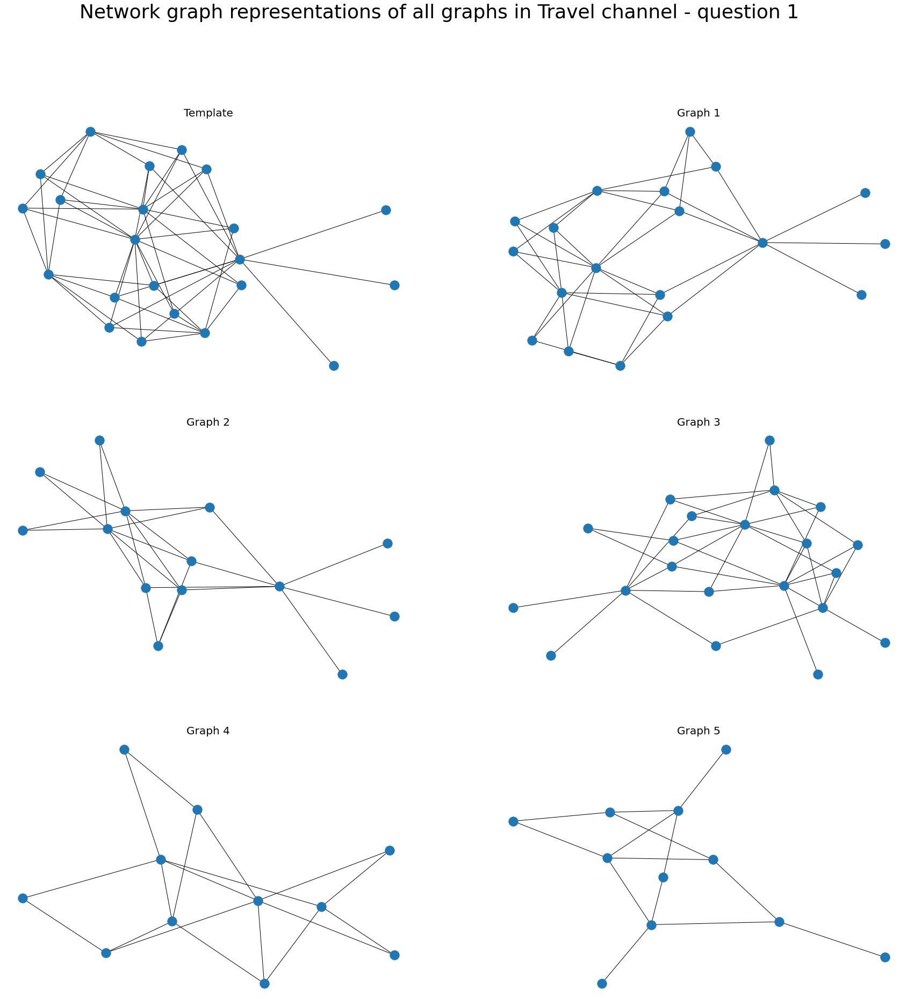

In [0]:
# Setting the graph size
f = plt.figure(figsize=(30,30))

# adding a title for the whole graph
f.suptitle('Network graph representations of all graphs in Travel channel - question 1', fontsize=36)
axs = list()
# Template subplot
axs.append(f.add_subplot(321))
nx.draw(templateG, with_labels=False, font_weight='bold', ax=axs[0])
axs[0].set_title('Template', fontsize = 20)

# Graph 1
axs.append(f.add_subplot(322))
nx.draw(graph1G, with_labels=False, font_weight='bold', ax=axs[1])
axs[1].set_title('Graph 1', fontsize = 20)

# Graph 2
axs.append(f.add_subplot(323))
nx.draw(graph2G, with_labels=False, font_weight='bold', ax=axs[2])
axs[2].set_title('Graph 2', fontsize = 20)

# Graph 3
axs.append(f.add_subplot(324))
nx.draw(graph3G, with_labels=False, font_weight='bold', ax=axs[3])
axs[3].set_title('Graph 3', fontsize = 20)

# Graph 4
axs.append(f.add_subplot(325))
nx.draw(graph4G, with_labels=False, font_weight='bold', ax=axs[4])
axs[4].set_title('Graph 4', fontsize = 20)

# Graph 5
axs.append(f.add_subplot(326))
nx.draw(graph5G, with_labels=False, font_weight='bold', ax=axs[5])
axs[5].set_title('Graph 5', fontsize = 20)


plt.show()

### Test for plotting

In [0]:
sampleFromBigGraph01Tuple = [tuple([x, y]) for x, y in zip(sampleFromBigGraph01["Source"], sampleFromBigGraph01["Target"])]

In [0]:
G.add_edges_from(sampleFromBigGraph01Tuple)

In [0]:
#G.add_edges_from([tuple([x, y]) for x, y in zip(sampleFromBigGraph01["Source"], sampleFromBigGraph01["Target"])])

In [0]:
import matplotlib.pyplot as plt

In [0]:
plt.subplot(111)
nx.draw(G, with_labels=True, font_weight='bold')

### drawing the network graphs of the template and all the graphs

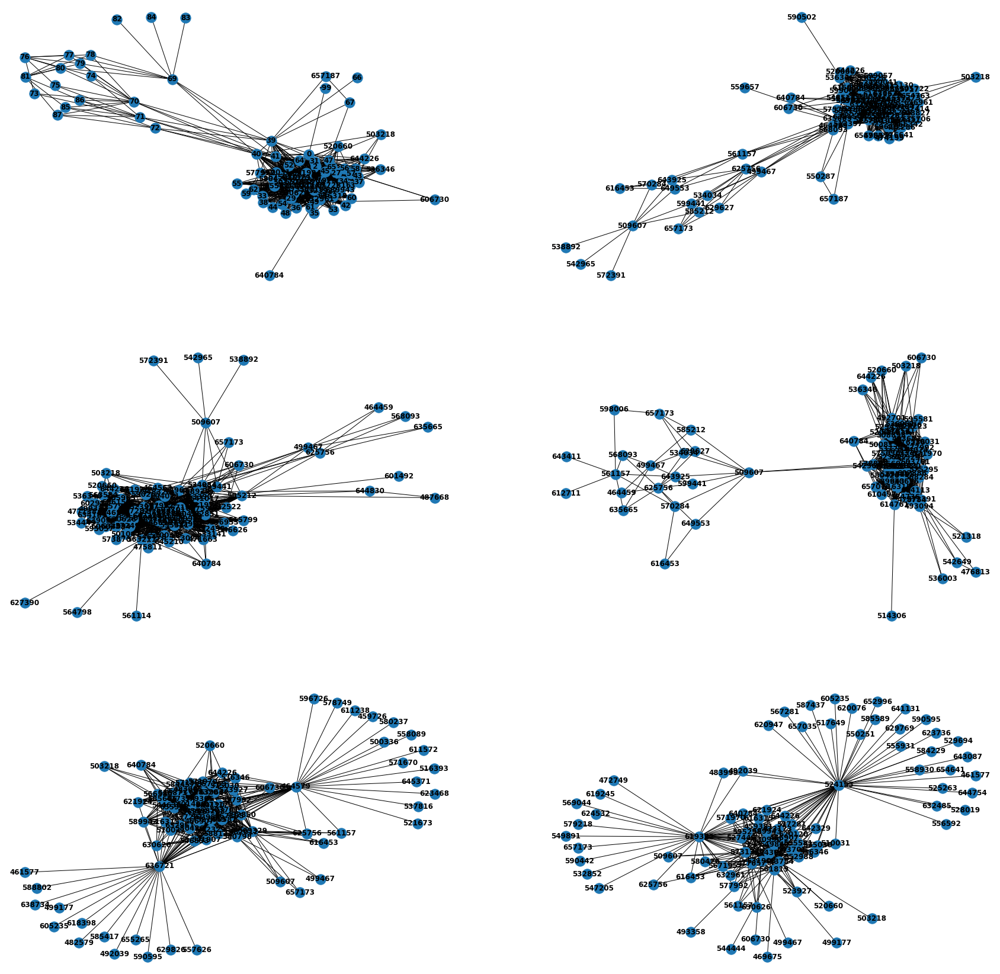

In [0]:
f = plt.figure(figsize=(30,30))
#ax = f.add_subplot(121)
#ax2 = f.add_subplot(122)
plt.subplot(321)
nx.draw(templateG, with_labels=True, font_weight='bold')
plt.subplot(322)
nx.draw(graph1G, with_labels=True, font_weight='bold')
plt.subplot(323)
nx.draw(graph2G, with_labels=True, font_weight='bold')
plt.subplot(324)
nx.draw(graph3G, with_labels=True, font_weight='bold')
plt.subplot(325)
nx.draw(graph4G, with_labels=True, font_weight='bold')
plt.subplot(326)
nx.draw(graph5G, with_labels=True, font_weight='bold')

### drawing the network graphs of the template and all the graphs NO Labels

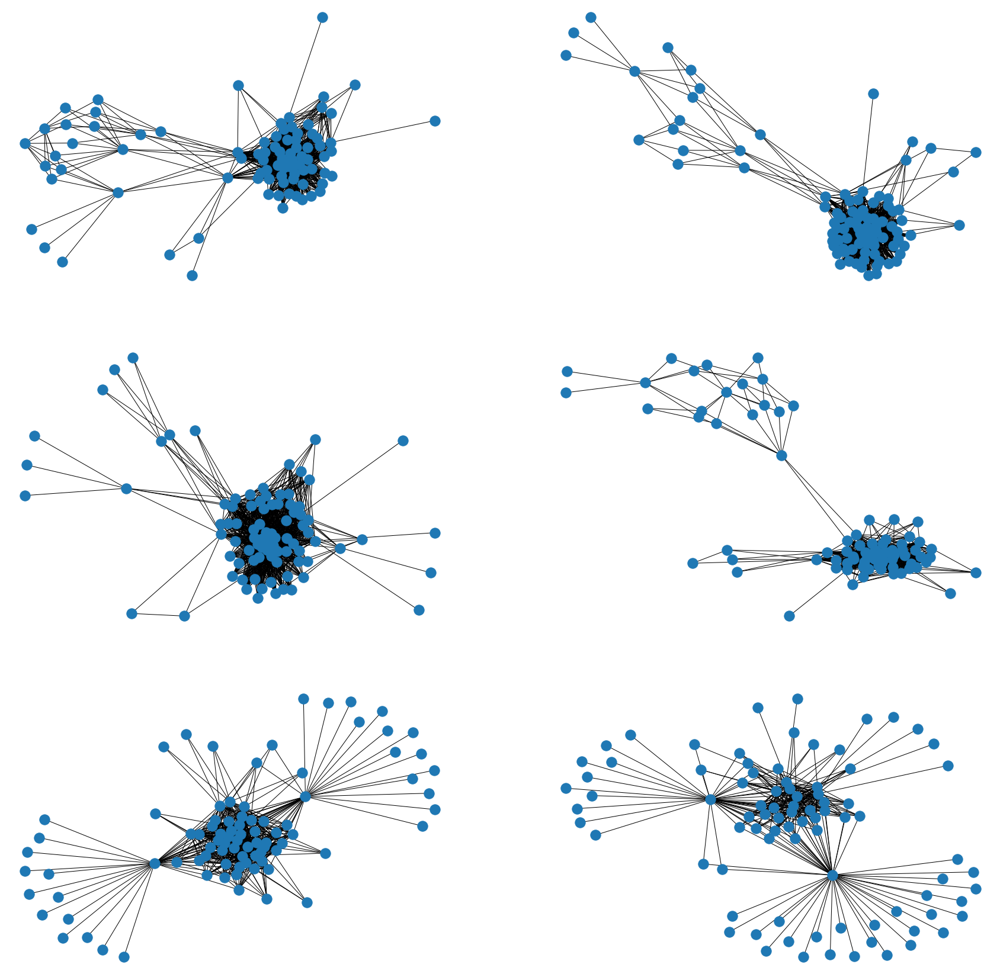

In [0]:
f = plt.figure(figsize=(30,30))
#ax = f.add_subplot(121)
#ax2 = f.add_subplot(122)
plt.subplot(321)
nx.draw(templateG, with_labels=False, font_weight='bold')
plt.subplot(322)
nx.draw(graph1G, with_labels=False, font_weight='bold')
plt.subplot(323)
nx.draw(graph2G, with_labels=False, font_weight='bold')
plt.subplot(324)
nx.draw(graph3G, with_labels=False, font_weight='bold')
plt.subplot(325)
nx.draw(graph4G, with_labels=False, font_weight='bold')
plt.subplot(326)
nx.draw(graph5G, with_labels=False, font_weight='bold')

#### Testing different types of graph drawings

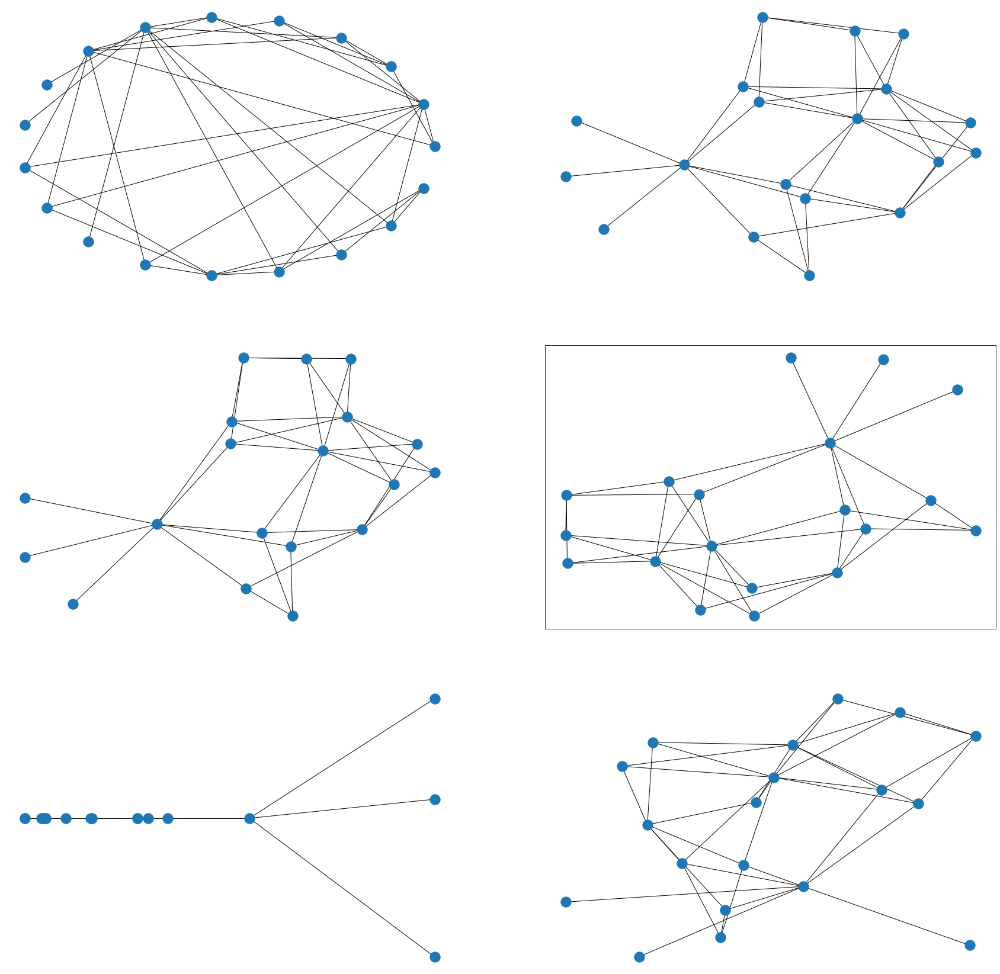

In [0]:
f = plt.figure(figsize=(30,30))
#ax = f.add_subplot(121)
#ax2 = f.add_subplot(122)
plt.subplot(321)
nx.draw_circular(graph1G, with_labels=False, font_weight='bold')
plt.subplot(322)
nx.draw_kamada_kawai(graph1G, with_labels=False, font_weight='bold')
plt.subplot(323)
nx.draw(graph1G, with_labels=False, font_weight='bold')
plt.subplot(324)
nx.draw_networkx(graph1G, with_labels=False, font_weight='bold')
plt.subplot(325)
nx.draw_spectral(graph1G, with_labels=False, font_weight='bold')
plt.subplot(326)
nx.draw_spring(graph1G, with_labels=False, font_weight='bold')

### network graphs for each channel test

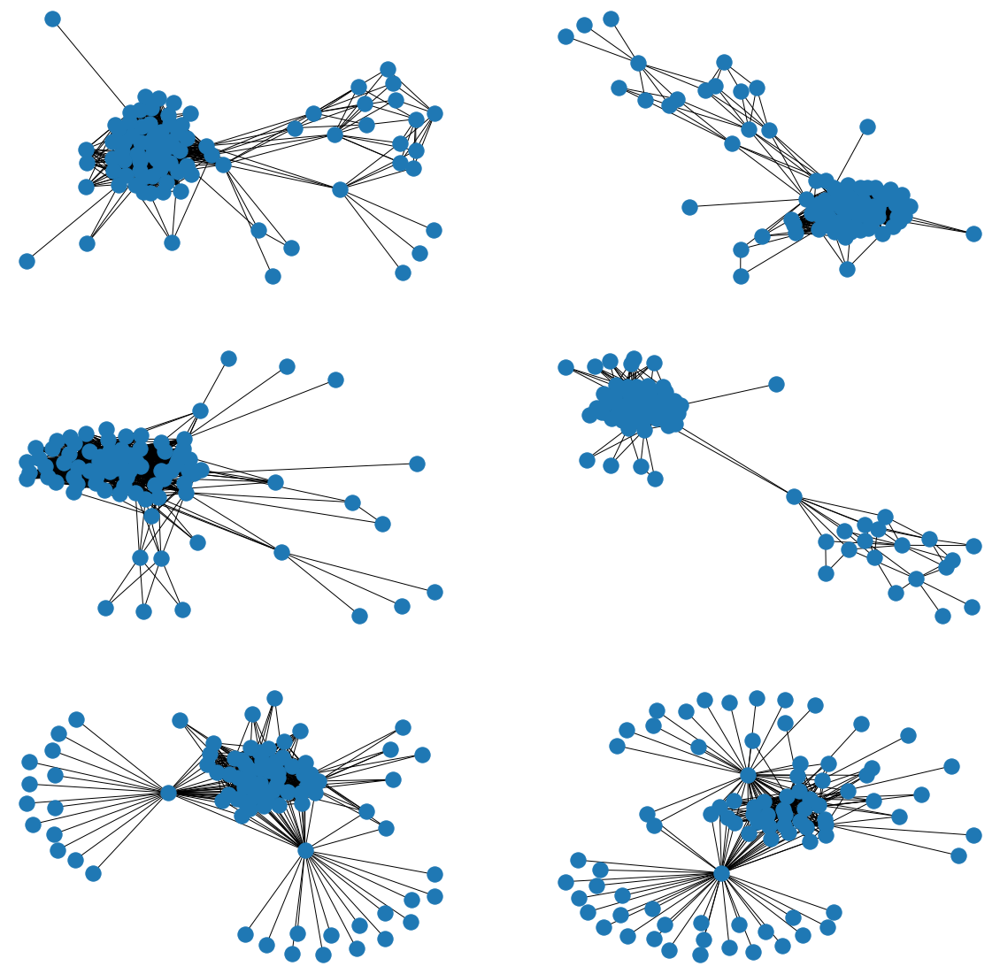

In [0]:
f = plt.figure(figsize=(20,20))
#ax = f.add_subplot(121)
#ax2 = f.add_subplot(122)
plt.subplot(321)
nx.draw(templateG, with_labels=False, font_weight='bold')
plt.subplot(322)
nx.draw(graph1G, with_labels=False, font_weight='bold')
plt.subplot(323)
nx.draw(graph2G, with_labels=False, font_weight='bold')
plt.subplot(324)
nx.draw(graph3G, with_labels=False, font_weight='bold')
plt.subplot(325)
nx.draw(graph4G, with_labels=False, font_weight='bold')
plt.subplot(326)
nx.draw(graph5G, with_labels=False, font_weight='bold')

In [0]:
# for pathT in nx.algorithms.all_simple_paths(templateG, source = 37, target = -99):
#  pass
# print(pathT) 
# approximation.ramsy_R2(templateG)
print(nx.algorithms.all_simple_paths(templateG, source = 37, target = 34))
# nx.algorithms.all_simple_paths(templateG, source = 37, target = -99)
templateGD = nx.DiGraph(templateNodesTuple)

roots = (v for v, d in templateGD.in_degree() if d == 0)
leaves = [v for v, d in templateGD.out_degree() if d == 0]

print(list(roots))
print(list(leaves))
print(type(roots))

<generator object _all_simple_paths_graph at 0x7fd5eea16e60>
[78, 80, 77, 79, 82, 83, 84, 73, 75, 74, 87, 85, 86, 510031, 552988]
[-99, 66, 657187, 81, 70, 69, 76, 71, 72, 630626, 536346, 520660, 567195, 527449, 459381, 595298, 466907, 589943, 577992, 537281, 523927, 580426, 595581, 642329, 503701, 571970, 644226, 632961, 473173, 621924, 616315, 575030, 503218, 640784, 606730]
<class 'generator'>


In [0]:
for nextRoot in roots:
  print(nextRoot)

In [0]:
for nextLeaf in leaves:
  print(nextLeaf)

-99
66
657187
81
70
69
76
71
72
630626
536346
520660
567195
527449
459381
595298
466907
589943
577992
537281
523927
580426
595581
642329
503701
571970
644226
632961
473173
621924
616315
575030
503218
640784
606730


In [0]:
from itertools import chain
from itertools import product
from itertools import starmap
from functools import partial

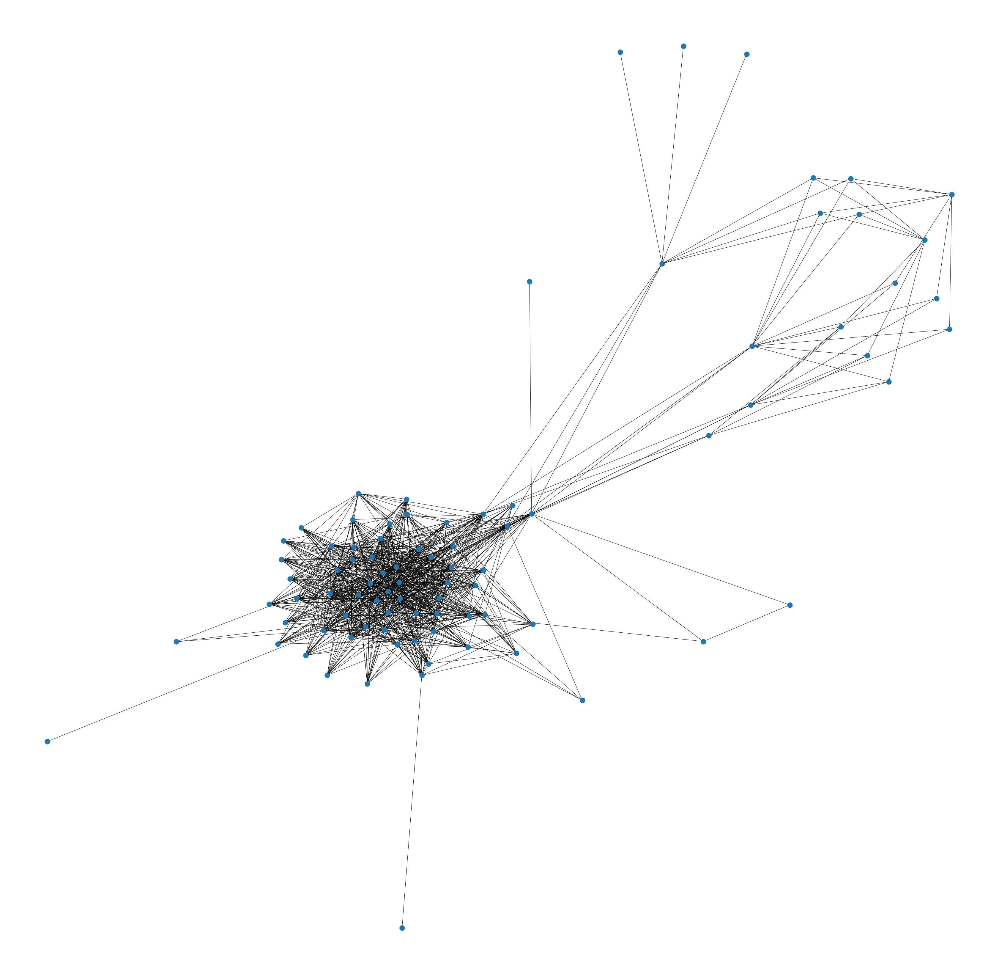

In [0]:
f = plt.figure(figsize=(60,60))
plt.subplot(111)
nx.draw(templateG, with_labels=False, font_weight='bold')

## clustering the big graph

In [0]:
G = nx.Graph()

In [0]:
sampleClusters = nx.clustering(G)

In [0]:
len(sampleClusters)

5070

In [0]:
templateGraphClusters = nx.clustering(templateG)

### a network graph of sample size of 10 thousands

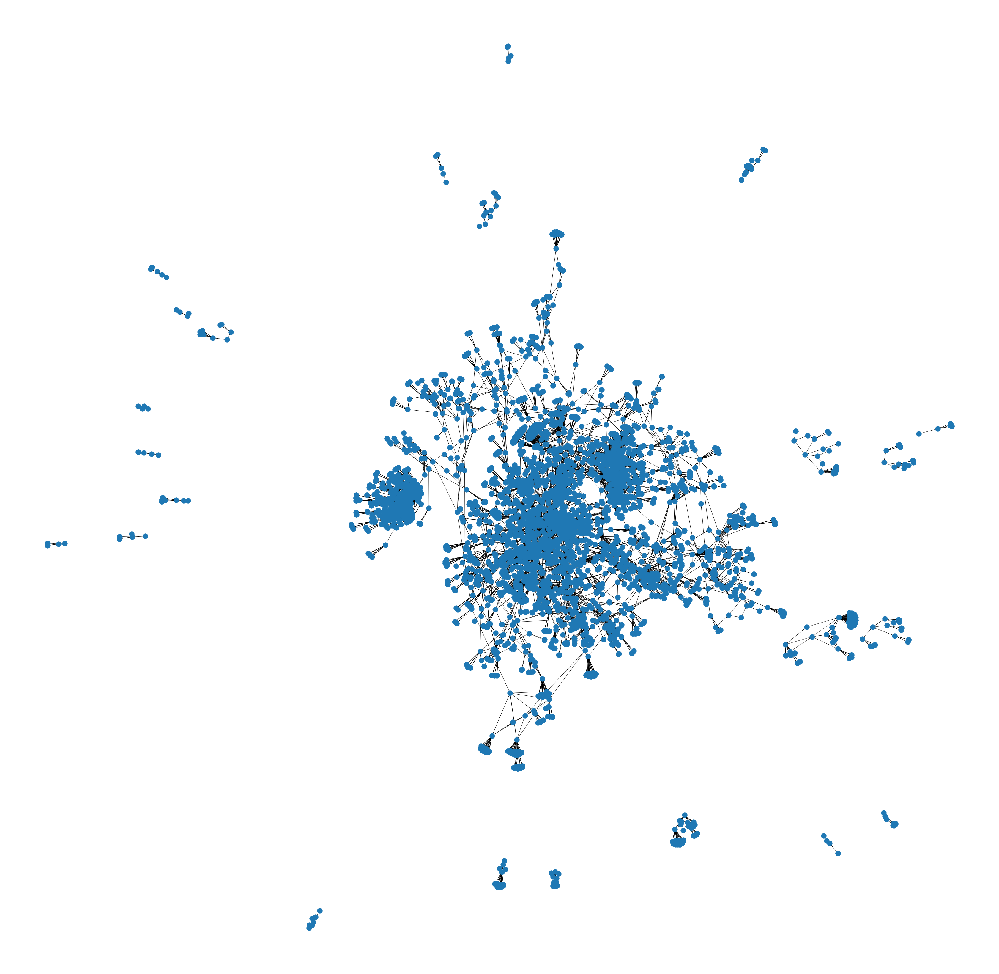

In [0]:
f = plt.figure(figsize=(60,60))
plt.subplot(111)
nx.draw(G, with_labels=False, font_weight='bold')

### Finding the number of roots and leaves in the big graph

In [0]:
bigGraphTuple = [tuple([x, y]) for x, y in zip(dfBigGraph[(dfBigGraph["eType"] == 0)]["Source"], dfBigGraph[(dfBigGraph["eType"] == 0)]["Target"])]
GD = nx.DiGraph(bigGraphTuple)

rootsBG = (v for v, d in GD.in_degree() if d == 0)
leavesBG = [v for v, d in GD.out_degree() if d == 0]


In [0]:
#print(len(list(rootsBG)))
#print(len(list(leavesBG)))

## Time

### Loading the question 1 graphs

In [0]:
dfTemplate = pd.read_csv('drive/My Drive/data/CGCS-Template.csv')
dfGraph1 = pd.read_csv('drive/My Drive/data/Q1-Graph1.csv')
dfGraph2 = pd.read_csv('drive/My Drive/data/Q1-Graph2.csv')
dfGraph3 = pd.read_csv('drive/My Drive/data/Q1-Graph3.csv')
dfGraph4 = pd.read_csv('drive/My Drive/data/Q1-Graph4.csv')
dfGraph5 = pd.read_csv('drive/My Drive/data/Q1-Graph5.csv')

In [0]:
timeTemplate = dfTemplate["Time"]

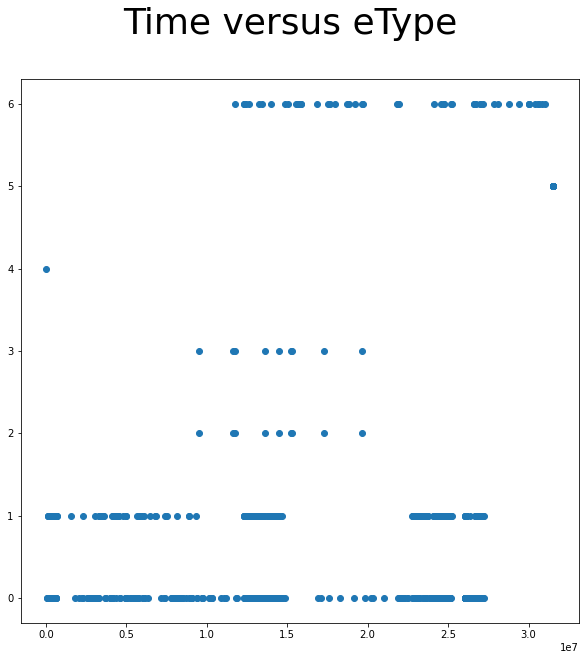

In [0]:
# Setting the graph size
f = plt.figure(figsize=(10,10))

# adding a title for the whole graph
f.suptitle('Time versus eType', fontsize=36)

plt.scatter(timeTemplate, dfTemplate['eType'], s=None, c=None, marker=None, cmap=None, norm=None, vmin=None, vmax=None, alpha=None, linewidths=None)

# Plotting the values on the time Scale

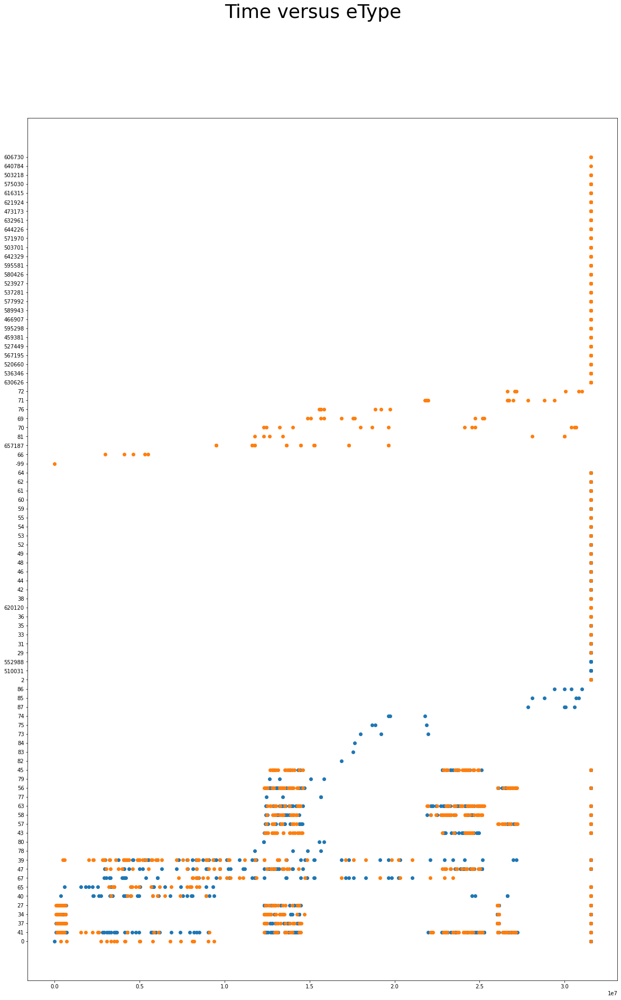

In [0]:
# Setting the graph size
f = plt.figure(figsize=(20,30))

# adding a title for the whole graph
f.suptitle('Time versus Source and Target', fontsize=36)

timeTemplate = dfTemplate["Time"]
sourceStringList = [str(x) for x in dfTemplate['Source']]
targetStringList = [str(x) for x in dfTemplate['Target']]

plt.scatter(timeTemplate, sourceStringList, s=None, c=None, marker=None, cmap=None, norm=None, vmin=None, vmax=None, alpha=None, linewidths=None)
plt.scatter(timeTemplate, targetStringList, c='#ff7f0e')

plt.show()

In [0]:
a = [1,2,3,4,5]
#str(a[:])
print(" ".join(map(str,a)))
sa = " ".join(map(str,a))

mystring = [str(x) for x in a]
mystring

1 2 3 4 5


['1', '2', '3', '4', '5']

In [0]:
timeTemplate

0            -99
1          86400
2          94461
3         107548
4         127838
          ...   
1320    31536000
1321    31536000
1322    31536000
1323    31536000
1324    31536000
Name: Time, Length: 1325, dtype: int64

#### Current date based on the Unix timestamps

In [0]:
from datetime import datetime

timestamp = datetime.fromtimestamp(1735689600)
print("Current Date =", timestamp)

Date = 2025-01-01 00:00:00


#### Creating a time array from Template timstamps


In [0]:
timeTemplateDate = list()
for i in timeTemplate:
  timeTemplateDate.append(datetime.fromtimestamp(1735689600 + i))

In [0]:
#print(timeTemplateDate)
print(datetime.fromtimestamp(1735689600 + 3.153600e+07))
print(datetime.fromtimestamp(1735689600 + (-2.702016e+09)))

2026-01-01 00:00:00
1939-05-19 16:00:00


In [0]:
# Setting the graph size
f = plt.figure(figsize=(10,10))

# adding a title for the whole graph
f.suptitle('count of eType', fontsize=36)

#counting each eType
eTypeArr = list()
for i in range(6):
  eTypeArr.append([len(dfTemplate[(dfTemplate['eType'] == i)]['eType'])])
  eTypeArr[i].append(len(dfGraph1[(dfGraph1['eType'] == i)]['eType']))
  eTypeArr[i].append(len(dfGraph2[(dfGraph2['eType'] == i)]['eType']))
  eTypeArr[i].append(len(dfGraph3[(dfGraph3['eType'] == i)]['eType']))
  eTypeArr[i].append(len(dfGraph4[(dfGraph4['eType'] == i)]['eType']))
  eTypeArr[i].append(len(dfGraph5[(dfGraph5['eType'] == i)]['eType']))

print(eTypeArr)

#plt.bar(list(range(6)), eTypeArr[1])

[[314, 187, 258, 109, 45, 17], [249, 131, 177, 51, 61, 14], [9, 7, 7, 6, 5, 11], [9, 7, 7, 6, 12, 40], [1, 1, 4, 1, 0, 0], [691, 846, 823, 519, 494, 203]]


<Figure size 720x720 with 0 Axes>

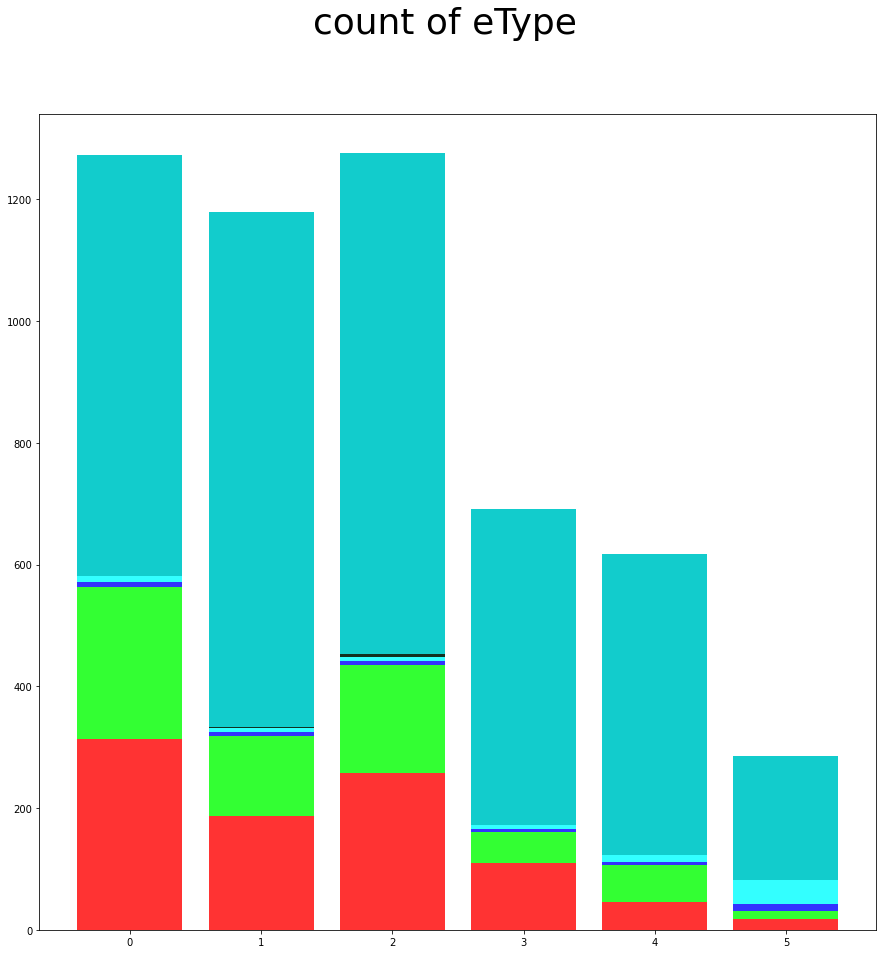

In [0]:
# Setting the graph size
f = plt.figure(figsize=(15,15))

# adding a title for the whole graph
f.suptitle('count of eType', fontsize=36)

width = 0.35       # the width of the bars: can also be len(x) sequence
ind = list(range(6))
'''
p = list()
p.append(plt.bar(ind, eTypeArr[0], width, yerr=ind))
for i in range(1, len(ind)):
  p.append(plt.bar(ind, eTypeArr[i], width, bottom=eTypeArr[i], yerr=ind))
#p1 = plt.bar(ind, eTypeArr[0], width, yerr=ind)
#p2 = plt.bar(ind, eTypeArr[1], width, bottom=eTypeArr[1], yerr=ind)

plt.ylabel('Count based on eType')
plt.title('Different datasets')
#plt.xticks(ind, ('G1', 'G2', 'G3', 'G4', 'G5'))
#plt.yticks(np.arange(0, 81, 10))
#plt.legend((p[0][0], p[0][0], p[0][0], p[0][0], p[0][0], p[0][0]), ('T', 'G1','G1','G1','G1','G5'))
'''

data = np.array(eTypeArr)
bottom = np.vstack((np.zeros((data.shape[1],), dtype=data.dtype),
                    np.cumsum(data, axis=0)[:-1]))
colors = ('#ff3333', '#33ff33', '#3333ff', '#33ffff', "#123121", "#12cccc")
for dat, col, bot in zip(data, colors, bottom):
    plt.bar(ind, dat, color=col, bottom=bot)


plt.show()

In [0]:
p[:][0]

<BarContainer object of 6 artists>

array([[314, 187, 258, 109,  45,  17],
       [249, 131, 177,  51,  61,  14],
       [  9,   7,   7,   6,   5,  11],
       [  9,   7,   7,   6,  12,  40],
       [  1,   1,   4,   1,   0,   0],
       [691, 846, 823, 519, 494, 203]])

#### checking the seeds for question 2

In [0]:
print(538771 in dfBigGraph["Source"])
print(538771 in dfBigGraph["Target"])
print(473043 in dfBigGraph["Source"])
print(473043 in dfBigGraph["Target"])
print(579269 in dfBigGraph["Source"])
print(579269 in dfBigGraph["Target"])
print(600971 in dfBigGraph["Source"])
print(600971 in dfBigGraph["Target"])
print(574136 in dfBigGraph["Source"])
print(574136 in dfBigGraph["Target"])
print(657187 in dfBigGraph["Source"])
print(657187 in dfBigGraph["Target"])

True
True
True
True
True
True
True
True
True
True
True
True
